In [1]:
import librosa
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn as sk
import scipy

In [2]:
audio = []
auxiox = ["[0,0]","[0,1]"]
audio.append(auxiox)
auxiox = ["[1,0]","[1,1]"]
audio.append(auxiox)
auxiox = ["[2,0]","[2,1]"]
audio.append(auxiox)

print (audio)

print (audio[2][1])


[['[0,0]', '[0,1]'], ['[1,0]', '[1,1]'], ['[2,0]', '[2,1]']]
[2,1]


In [ ]:
nfiles = len(os.listdir('Palitubuntu'))
print(nfiles)
audio = []
print(audio)
for file in range(nfiles):
    audiox = []
    a, sr = librosa.load('Palitubuntu/' + str(file) + '_Palito.wav')
    audiox.append(a)
    audiox.append(file)
    audio.append(audiox)
a = None
print(audio)
print(sr)
print(audio[0][0].shape)

3
[]


In [ ]:
# Cut audio samples and save each as a .npy file, with a CSV index
import csv

os.makedirs('audio_samples', exist_ok=True)
index_rows = []

def divide_amostragem_to_disk(X, sr, n, file_id):
    sample_paths = []
    for i in range(n):
        size = np.random.randint(10*sr, sr*((len(X)/sr)/10))
        start = np.random.randint(0, len(X) - size)
        sample = X[start:(start + size)]
        sample_path = f'audio_samples/{file_id}_sample_{i}.npy'
        np.save(sample_path, sample)
        sample_paths.append(sample_path)
    return sample_paths

index_rows = []
for file in range(nfiles):
    sample_paths = divide_amostragem_to_disk(audio[file][0], sr, 70, file)
    for sample_path in sample_paths:
        index_rows.append({'path': sample_path, 'label': audio[file][1]})

# Save index to CSV
index_df = pd.DataFrame(index_rows)
index_df.to_csv('audio_sample_index.csv', index=False)
print('Saved samples and index to disk.')
print(index_df.head())

In [ ]:
# Load samples and labels from disk using the CSV index
index_df = pd.read_csv('audio_sample_index.csv')
data = pd.DataFrame(columns=['X', 'Y'])
for i, row in index_df.iterrows():
    sample = np.load(row['path'])
    data.loc[i, 'X'] = sample
    data.loc[i, 'Y'] = row['label']
print('Loaded samples from disk:')
print(data.head())

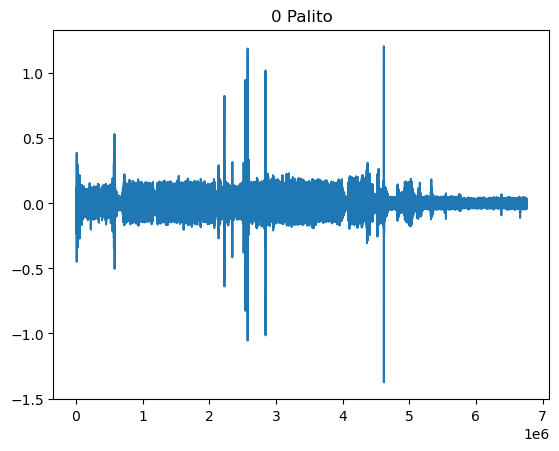

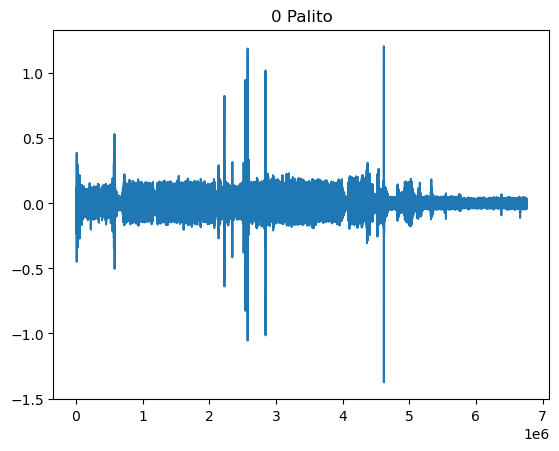

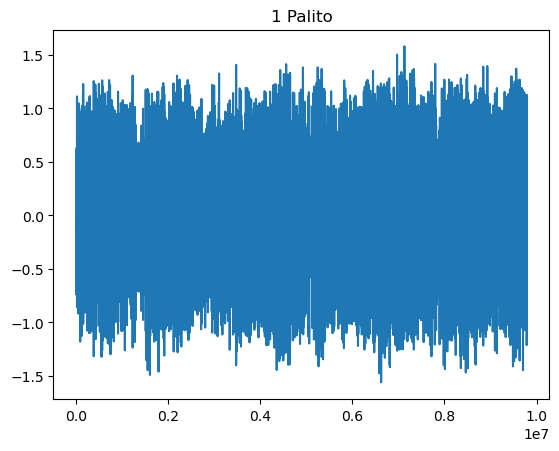

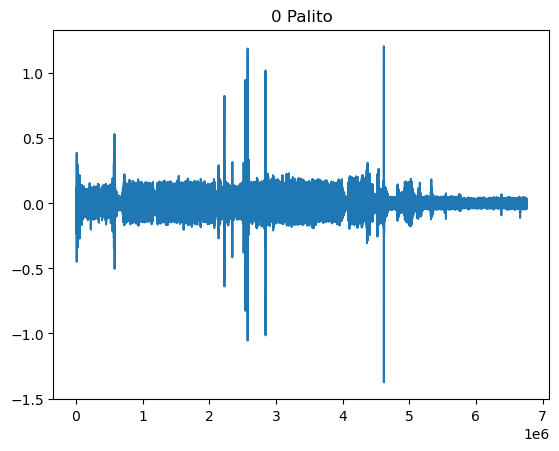

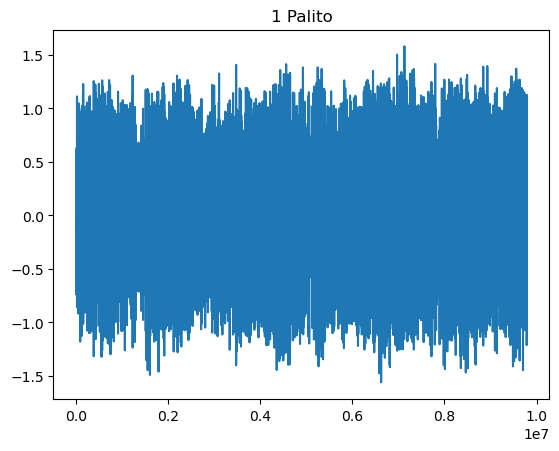

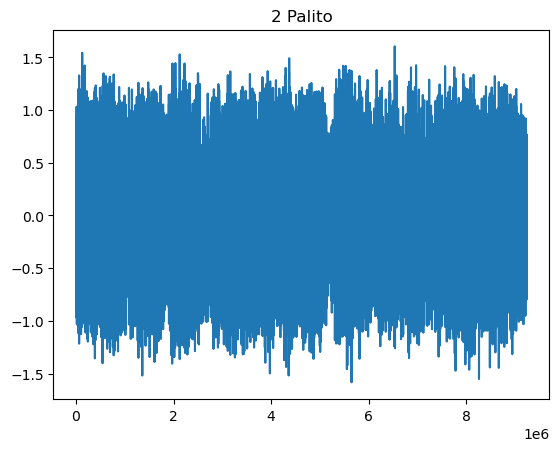

In [ ]:
for file in range(nfiles):
    plt.plot(audio[file][0])
    plt.title( str(audio[file][1]) + ' Palito')  
    plt.show()

/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0.5, 1.0, '0 Palito')

/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/cauaf/miniconda3/envs/lucifer/lib/python3.13/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


Text(0.5, 1.0, '0 Palito')

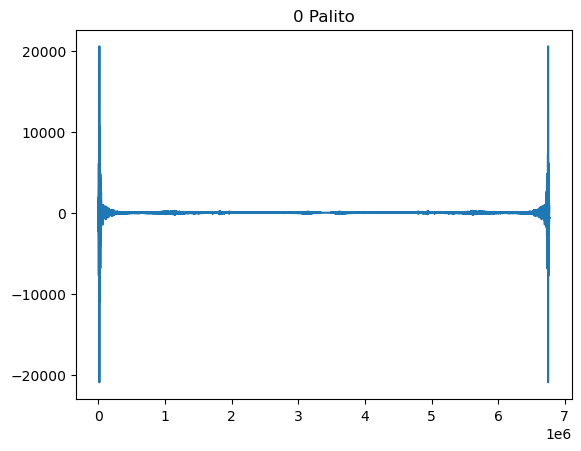

In [ ]:
plt.plot(np.fft.fft(audio[0][0]))
plt.title( str(audio[0][1]) + ' Palito')


In [ ]:
def divide_amostragem (X, sr, n):
    x = []

    #print("Cortando Áudio", file+1)
    for i in range(n):
        #print(f"{((i+1)/n)*100:.1f}% Processado")
        size = np.random.randint(10*sr, sr*((len(X)/sr)/10))
        start = np.random.randint(0, len(X) - size)
        x.append(X[start:(start + size)])
    
    return x

In [ ]:
# Shuffle data
data = sk.utils.shuffle(data).reset_index(drop=True)
print(data.head())

# Calculate FFT for each sample (disk-based)
print("Calculando ffts")
for i in range(len(data)):
    print(f"{(i+1)/len(data)*100:.1f}% Processado")
    data.loc[i,'X'] = np.abs(np.fft.fft(data.loc[i,'X']))
    data.loc[i,'X'] = data.loc[i,'X'][0:len(data.loc[i,'X'])//2]

# Plot random FFTs
for i in range(10):
    rand = np.random.randint(0, len(data))
    plt.plot(data['X'][rand])
    plt.title(str(data['Y'][rand]) + ' Palito')
    plt.show()

# Find peaks for each FFT sample
print("Encontrando picos")
for i in range(len(data)):
    smooth, props = scipy.signal.find_peaks(data['X'][i], distance=1000)
    peaks, props = scipy.signal.find_peaks(data['X'][i][smooth],
                                           prominence=(np.max(data['X'][i][smooth])/30, np.max(data['X'][i][smooth])),
                                           distance=len(data['X'][i][smooth])//60,
                                           height=(np.max(data['X'][i][smooth])//100, np.max(data['X'][i][smooth])),
                                           width=None)
    db = np.array([data['X'][i][peaks], peaks])
    data.loc[i, 'X'] = db

# Pad all peak arrays and format for PyTorch
PADDING_VALUE = -999
def pad_db_sequences(sequences, padding_value=PADDING_VALUE):
    values_list = [np.array(seq[0], dtype=np.float32) for seq in sequences]
    indices_list = [np.array(seq[1], dtype=np.float32) for seq in sequences]
    max_len = max(max(len(v), len(i)) for v, i in zip(values_list, indices_list))
    padded_values = []
    padded_indices = []
    for v, i in zip(values_list, indices_list):
        pad_v = np.pad(v, (0, max_len - len(v)), constant_values=padding_value)
        pad_i = np.pad(i, (0, max_len - len(i)), constant_values=padding_value)
        padded_values.append(pad_v)
        padded_indices.append(pad_i)
    padded_values = np.array(padded_values, dtype=np.float32)
    padded_indices = np.array(padded_indices, dtype=np.float32)
    X_np = np.stack([padded_values, padded_indices], axis=1)
    X = torch.tensor(X_np, dtype=torch.float32)
    return X

X = pad_db_sequences(list(data['X']), padding_value=PADDING_VALUE)

# Encode labels
unique_labels = {label: idx for idx, label in enumerate(sorted(set(data['Y'])))}
Y = torch.tensor([unique_labels[y] for y in data['Y']], dtype=torch.long)

# Normalize X (zero mean, unit variance, ignoring padding value)
def normalize_X(X, padding_value=PADDING_VALUE):
    X_np = X.numpy()
    X_norm_np = np.copy(X_np)
    for feature in range(X_np.shape[1]):
        for seq in range(X_np.shape[0]):
            mask = X_np[seq, feature, :] != padding_value
            valid = X_np[seq, feature, :][mask]
            mean = valid.mean() if valid.size > 0 else 0.0
            std = valid.std() if valid.size > 0 else 1.0
            X_norm_np[seq, feature, :][mask] = (X_np[seq, feature, :][mask] - mean) / (std if std > 0 else 1.0)
    X_norm = torch.tensor(X_norm_np, dtype=torch.float32)
    return X_norm

X = normalize_X(X, padding_value=PADDING_VALUE)
print(X, Y)
print(X.shape, Y.shape)
print(X.shape[2])

# Exclude sequences that are completely padding
def get_sequence_lengths(X, padding_value=PADDING_VALUE):
    mask = X[:, 0, :] != padding_value
    lengths = mask.sum(dim=1)
    return lengths

lengths = get_sequence_lengths(X, padding_value=PADDING_VALUE)
valid_mask = lengths > 0
X = X[valid_mask]
Y = Y[valid_mask]
print(f"Excluded {len(valid_mask) - valid_mask.sum().item()} all-padding sequences.")
print(X.shape, Y.shape)

                                                     X  Y
0    [-0.0089378115, -0.024793724, -0.009021182, 0....  0
1    [0.009663328, 0.003923456, 0.0067516575, 0.009...  0
2    [-0.02443549, -0.025392132, -0.023938801, -0.0...  0
3    [0.00032197125, -0.010492405, 0.010635909, 0.0...  0
4    [0.04431324, 0.08401504, 0.07563485, 0.0473612...  0
..                                                 ... ..
205  [0.015162155, 0.014728807, 0.01519887, 0.01404...  2
206  [-0.0060881036, -0.0026895925, -0.006231103, -...  2
207  [-0.0032798448, -0.009655102, -0.003953088, -0...  2
208  [-0.0039113387, 4.2840838e-07, 0.040311657, 0....  2
209  [0.0018032677, 0.00070010126, 0.0048284195, 0....  2

[210 rows x 2 columns]


In [ ]:
data = sk.utils.shuffle(data).reset_index(drop=True)

print(data)

                                                     X  Y
0    [-0.027028117, -0.0351458, -0.037246853, -0.03...  2
1    [0.05195789, 0.06182895, 0.03124012, 0.0030311...  1
2    [0.048096154, -0.016390983, -0.09484043, -0.14...  1
3    [0.009663328, 0.003923456, 0.0067516575, 0.009...  0
4    [-0.04142528, 0.02499443, -0.11308882, -0.0687...  2
..                                                 ... ..
205  [-0.018550303, -0.01888265, -0.017321661, -0.0...  2
206  [0.0072295796, 0.010238056, 0.009027099, 0.009...  2
207  [-0.030528769, -0.028174793, -0.027312193, -0....  0
208  [0.0030400008, -0.007978335, -0.013380114, -0....  2
209  [0.053099856, 0.06278719, 0.056705132, 0.03127...  0

[210 rows x 2 columns]


In [ ]:
print("Calculando ffts")

for i in range(len(data)):
   print(f"{(i+1)/len(data)*100:.1f}% Processado")
   data.loc[i,'X'] = np.abs(np.fft.fft(data.loc[i,'X']))
   data.loc[i,'X'] = data.loc[i,'X'][0:len(data.loc[i,'X'])//2]

Calculando ffts
0.5% Processado
1.0% Processado
1.4% Processado
1.9% Processado
1.4% Processado
1.9% Processado
2.4% Processado
2.9% Processado
3.3% Processado
2.4% Processado
2.9% Processado
3.3% Processado
3.8% Processado
4.3% Processado
4.8% Processado
3.8% Processado
4.3% Processado
4.8% Processado
5.2% Processado
5.7% Processado
5.2% Processado
5.7% Processado
6.2% Processado
6.2% Processado
6.7% Processado
6.7% Processado
7.1% Processado
7.6% Processado
7.1% Processado
7.6% Processado
8.1% Processado
8.6% Processado
8.1% Processado
8.6% Processado
9.0% Processado
9.5% Processado
9.0% Processado
9.5% Processado
10.0% Processado
10.5% Processado
11.0% Processado
10.0% Processado
10.5% Processado
11.0% Processado
11.4% Processado
11.9% Processado
11.4% Processado
11.9% Processado
12.4% Processado
12.4% Processado
12.9% Processado
13.3% Processado
13.8% Processado
12.9% Processado
13.3% Processado
13.8% Processado
14.3% Processado
14.8% Processado
14.3% Processado
14.8% Processado
15

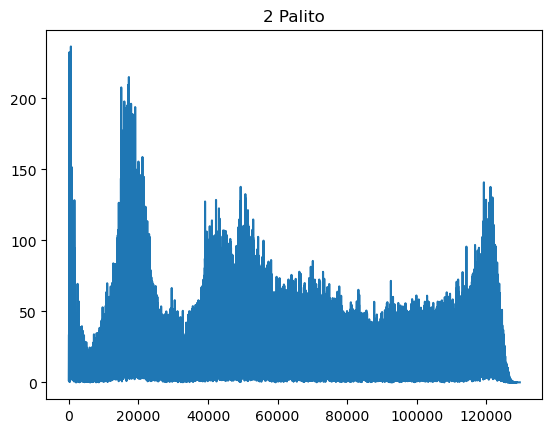

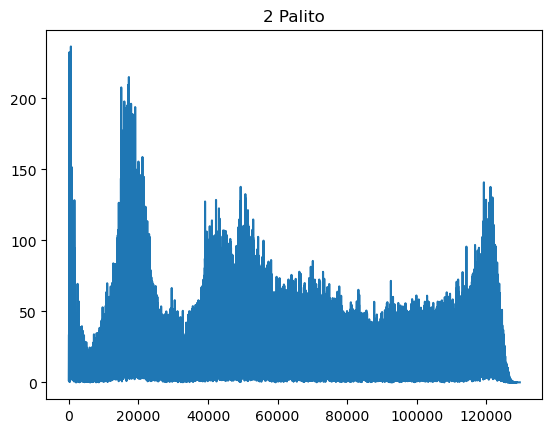

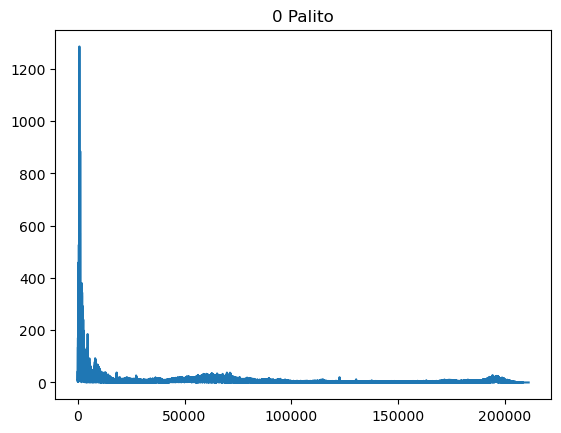

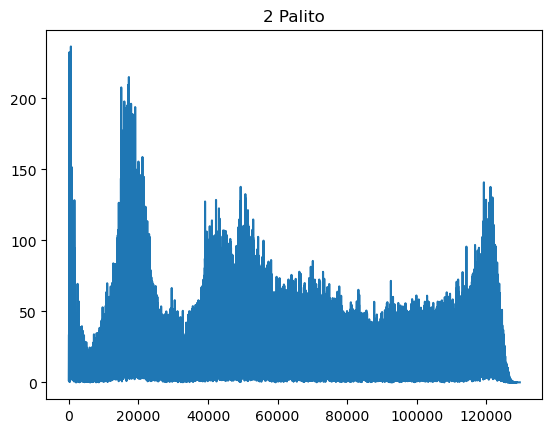

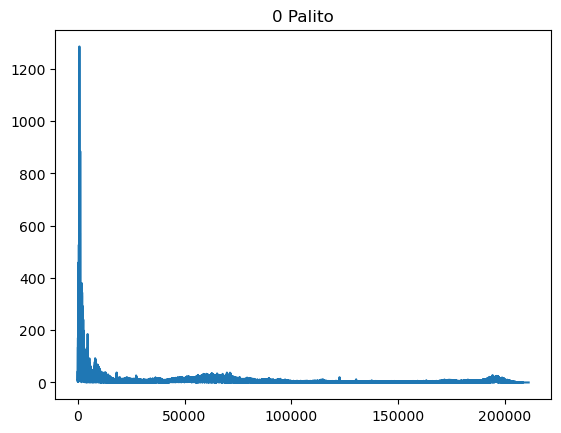

...

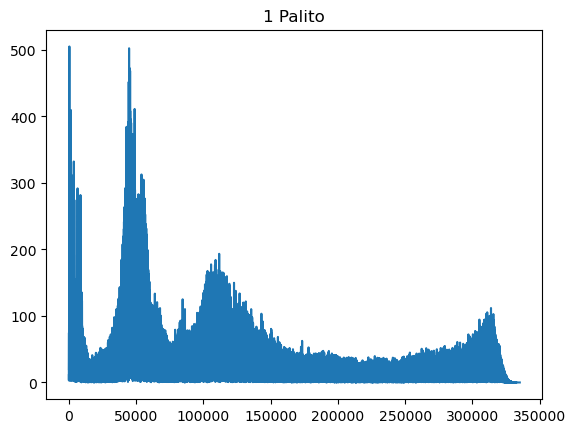

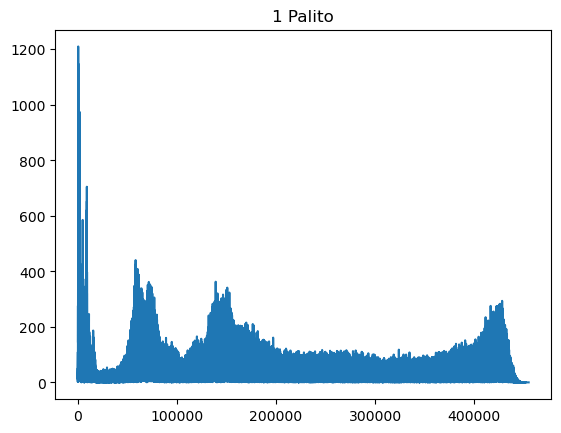

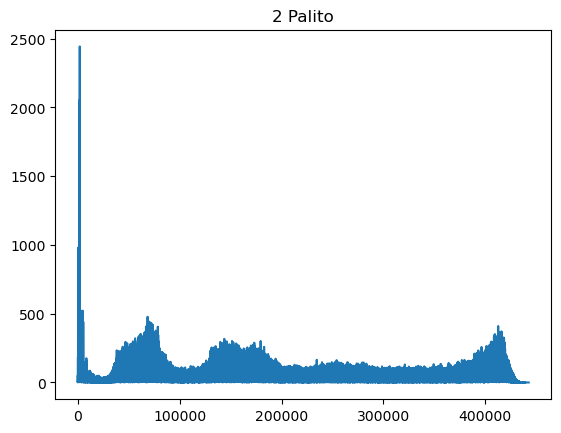

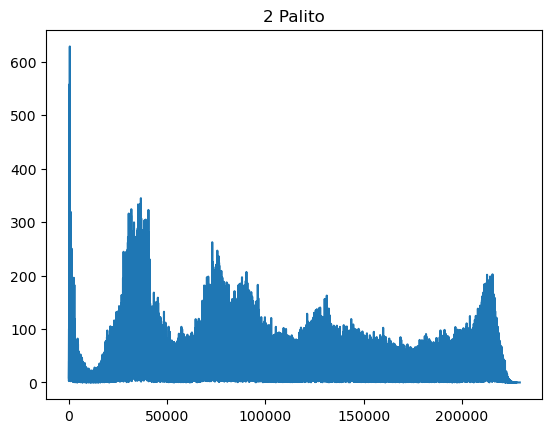

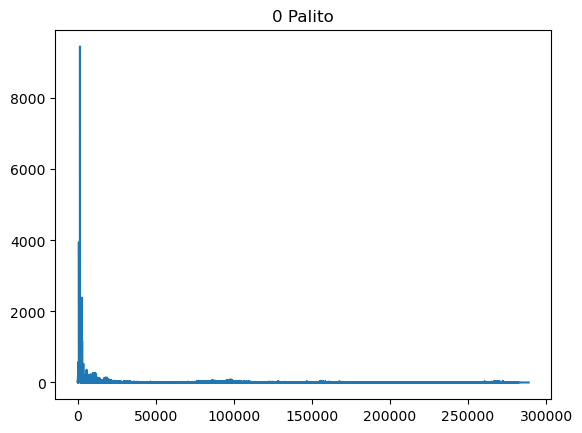

In [ ]:
for i in range(10):
    rand = np.random.randint(0, len(data))
    plt.plot(data['X'][rand])
    plt.title( str(data['Y'][rand]) + ' Palito')
    plt.show()



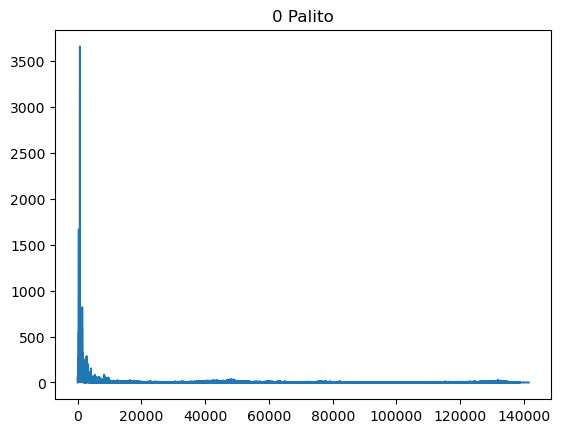

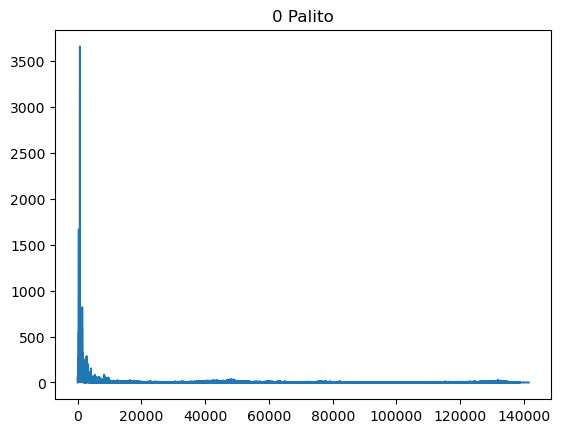

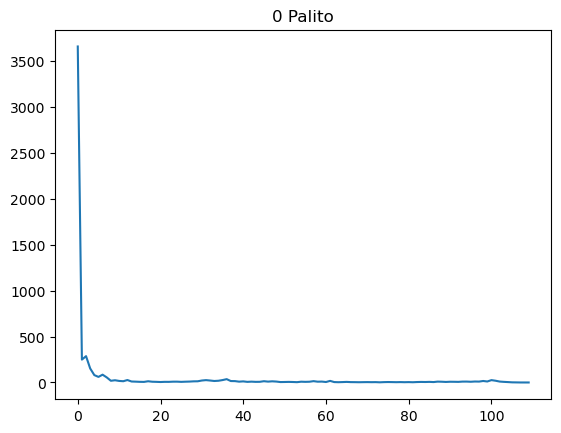

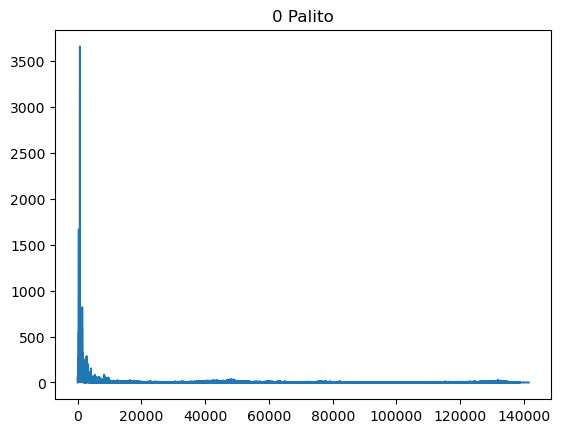

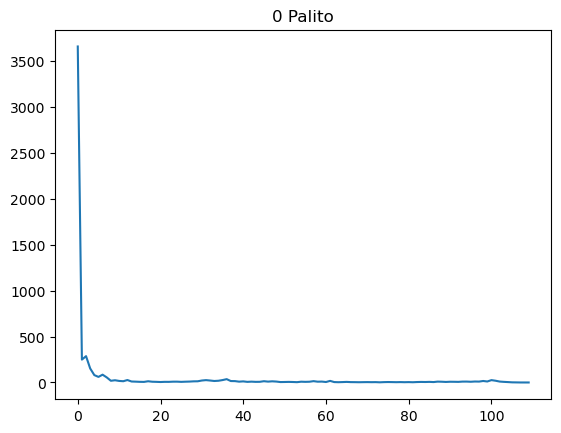

...

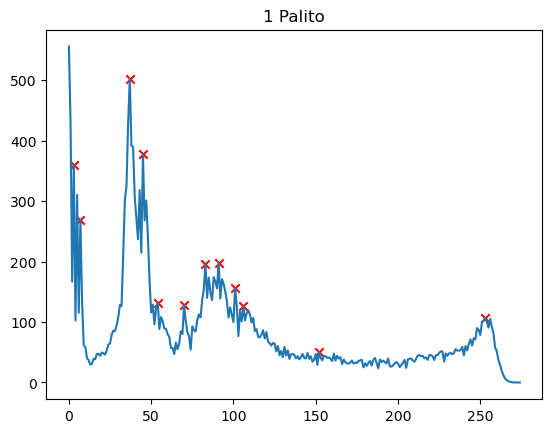

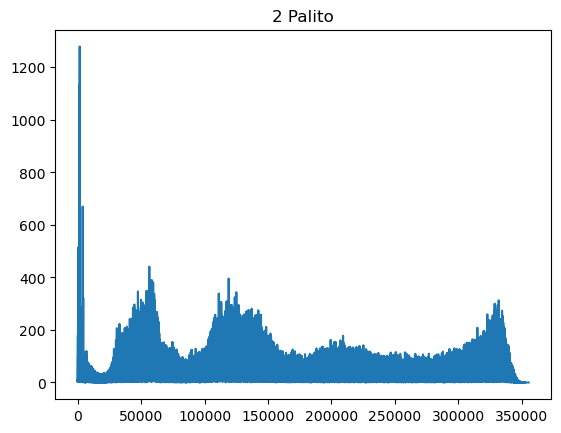

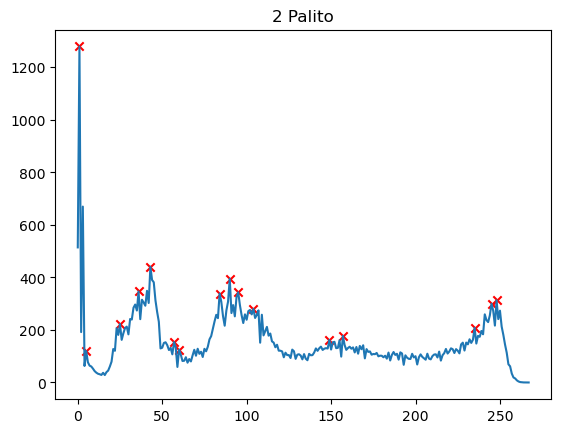

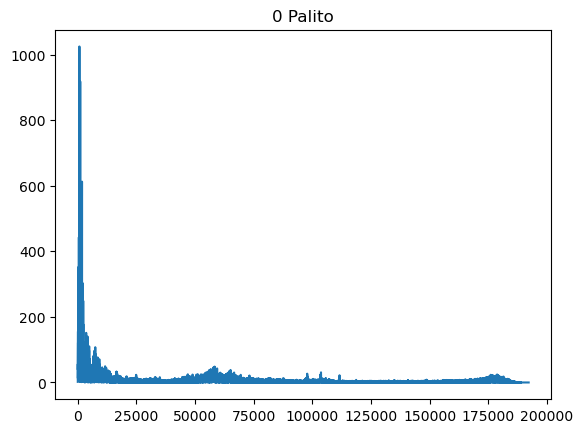

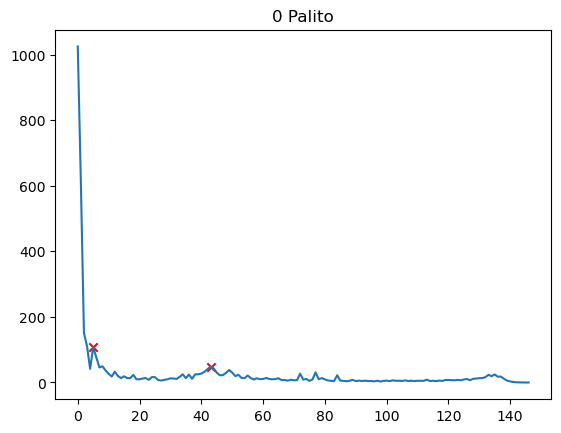

In [ ]:
for i in range(10):
    rand = np.random.randint(0,len(data))
    anal = rand
    smooth, props = scipy.signal.find_peaks(data['X'][rand], distance=1000)
    plt.title( str(data['Y'][anal]) + ' Palito')
    plt.plot(range(len(data['X'][anal])),data['X'][anal])
    plt.show()
    plt.close()
    peaks, properties = scipy.signal.find_peaks(data['X'][anal][smooth]
                                                , prominence=(np.max(data['X'][anal][smooth])/30,np.max(data['X'][anal][smooth]))
                                                , distance= np.max(smooth)//100000
                                                , height=(np.max(data['X'][anal][smooth])//100,np.max(data['X'][anal][smooth]))
                                                , width=None)
    plt.plot(data['X'][anal][smooth])
    plt.title( str(data['Y'][anal]) + ' Palito')
    plt.scatter(peaks, data['X'][anal][smooth][peaks], color='red', marker='x')
    plt.show()
    plt.close()

In [ ]:
def find_smoothed_peak(spectrum):
    smooth, props = scipy.signal.find_peaks(spectrum, distance=1000)
    peaks, props = scipy.signal.find_peaks(spectrum[smooth]
                                           , prominence=(np.max(spectrum[smooth])/30,np.max(spectrum[smooth]))
                                           , distance= np.max(smooth)//100000
                                           , height=(np.max(spectrum[smooth])//100,np.max(spectrum[smooth]))
                                           , width=None)
    plt.plot(spectrum[smooth])
    plt.scatter(peaks, spectrum[smooth][peaks], color='red', marker='x')
    plt.show()
    plt.close()
    return spectrum[smooth][peaks]

def find_smoothed_peaks (spectri):
    x = []
    for i in range(len(spectri)):
        peaks = find_smoothed_peak(spectri[i])
        x.append(spectri[i][peaks])
        print(f"{((i+1)/len(spectri))*100:.1f}% Processado")
    print(x)
    return x

In [ ]:
print("Encontrando picos")
for i in range(len(data)):
    smooth, props = scipy.signal.find_peaks(data['X'][i], distance=1000)
    peaks, props = scipy.signal.find_peaks(data['X'][i][smooth]
                                               , prominence=(np.max(data['X'][i][smooth])/30,np.max(data['X'][i][smooth]))
                                               , distance= len(data['X'][i][smooth])//60
                                               , height=(np.max(data['X'][i][smooth])//100,np.max(data['X'][i][smooth]))
                                               , width=None)
    db = np.array([data['X'][i][peaks],peaks])
    data.loc[i, 'X'] = db



Encontrando picos


In [ ]:
rand = np.random.randint(0, len(data))
print(data['X'][rand])

[[  7.66500759  12.43379211  11.48572445  19.46093559  15.70038795
   61.4586525   43.82309341  20.65965652  36.8196907   59.80029678
   26.82220459  55.74534607  20.02501678  51.75427628  52.67274475
  243.03604126  50.09211349  72.65209961]
 [  3.          34.          41.          48.          57.
   78.          88.          97.         102.         109.
  115.         124.         131.         149.         169.
  240.         256.         283.        ]]


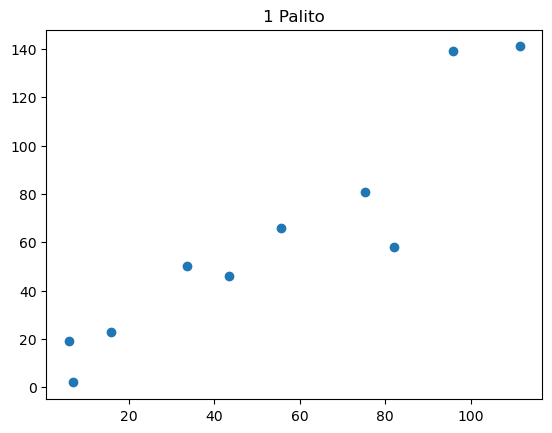

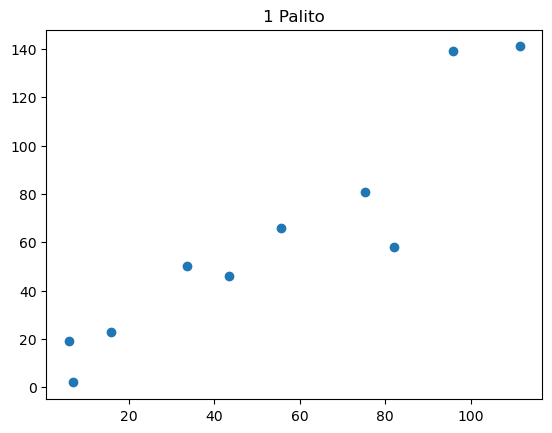

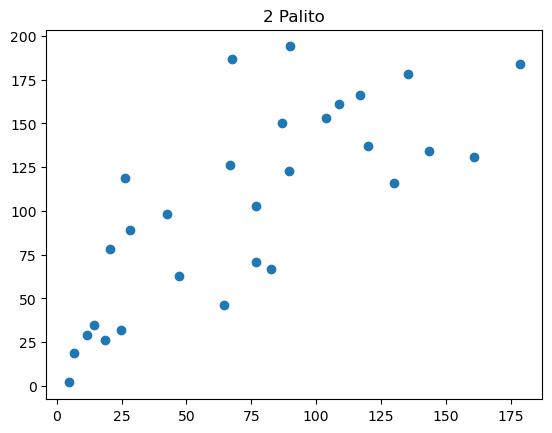

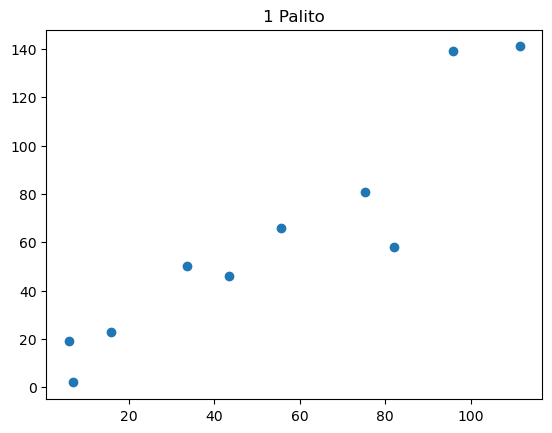

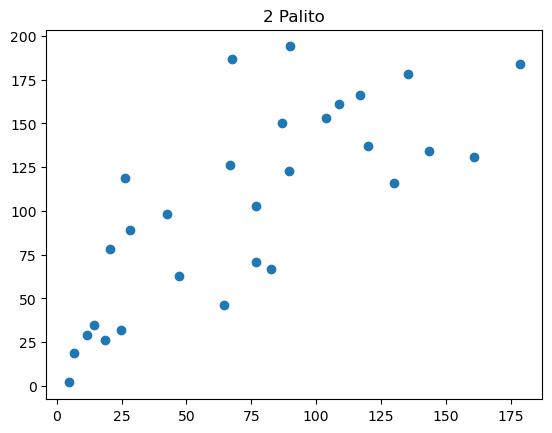

...

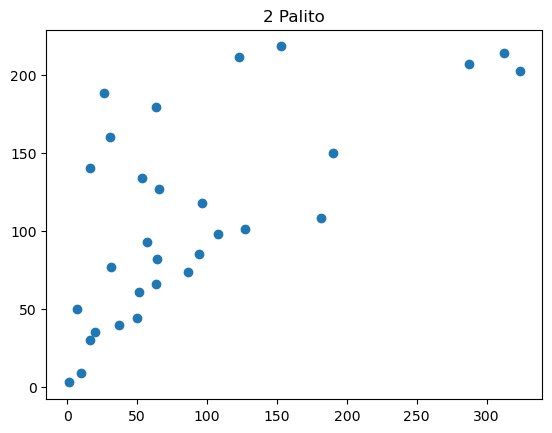

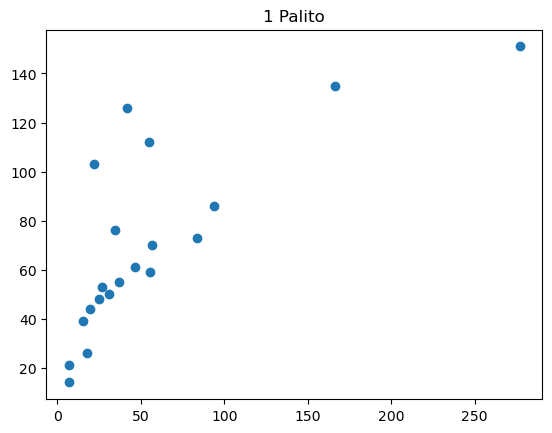

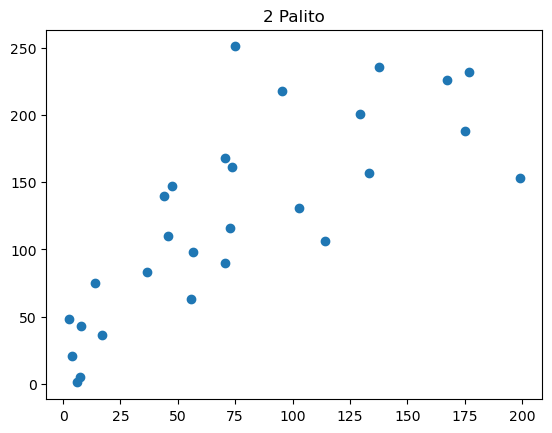

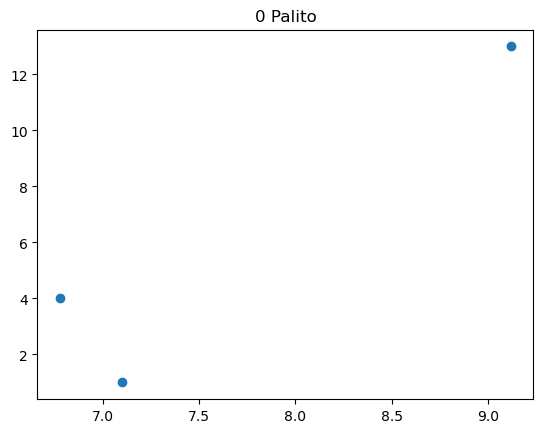

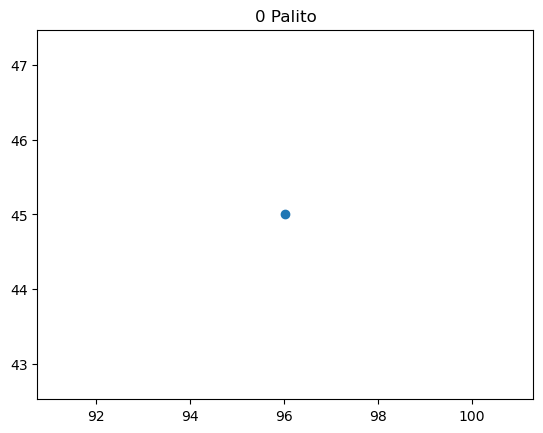

In [ ]:
for i in range(10):
    rand = np.random.randint(0, len(data))
    plt.scatter(data['X'][rand][0], data['X'][rand][1])
    plt.title( str(data['Y'][rand]) + ' Palito')
    plt.show()


In [ ]:
import torch
from torch import nn, optim
from torchinfo import summary

In [ ]:
class RNN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_layers=1, is_regression=False):
        super(RNN, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, output_size)
        self.tanh = nn.Tanh()
        self.is_regression = is_regression
        self.criterion = nn.MSELoss() if is_regression else nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.parameters(), lr=0.5, weight_decay=0.001)
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    def forward(self, x, lengths=None):
        # x shape: [batch, features, seq_len] -> [batch, seq_len, features]
        x = x.permute(0, 2, 1)
        if lengths is not None:
            packed = nn.utils.rnn.pack_padded_sequence(x, lengths, batch_first=True, enforce_sorted=False)
            out, _ = self.lstm(packed)
            out, _ = nn.utils.rnn.pad_packed_sequence(out, batch_first=True)
            # Take the last valid output for each sequence
            idx = (lengths - 1).view(-1, 1, 1).expand(out.size(0), 1, out.size(2))
            out = out.gather(1, idx).squeeze(1)
        else:
            out, _ = self.lstm(x)
            out = out[:, -1, :]
        out = self.fc(out)
        out = self.tanh(out)
        return out

In [ ]:
# Pad both arrays inside each entry of data['X'] so all have the same length
PADDING_VALUE = -999
def pad_db_sequences(sequences, padding_value=PADDING_VALUE):
    # Each sequence is [values, indices]
    values_list = [np.array(seq[0], dtype=np.float32) for seq in sequences]
    indices_list = [np.array(seq[1], dtype=np.float32) for seq in sequences]
    max_len = max(max(len(v), len(i)) for v, i in zip(values_list, indices_list))
    padded_values = []
    padded_indices = []
    for v, i in zip(values_list, indices_list):
        pad_v = np.pad(v, (0, max_len - len(v)), constant_values=padding_value)
        pad_i = np.pad(i, (0, max_len - len(i)), constant_values=padding_value)
        padded_values.append(pad_v)
        padded_indices.append(pad_i)
    # Convert lists to numpy arrays for efficient stacking
    padded_values = np.array(padded_values, dtype=np.float32)
    padded_indices = np.array(padded_indices, dtype=np.float32)
    # Stack as shape [batch, 2, max_len]
    X_np = np.stack([padded_values, padded_indices], axis=1)
    X = torch.tensor(X_np, dtype=torch.float32)
    return X

X = pad_db_sequences(list(data['X']), padding_value=PADDING_VALUE)

# Generalize Y for any value in data['Y']
unique_labels = {label: idx for idx, label in enumerate(sorted(set(data['Y'])))}
Y = torch.tensor([unique_labels[y] for y in data['Y']], dtype=torch.long)

# Normalize X (zero mean, unit variance, ignoring padding value)
def normalize_X(X, padding_value=PADDING_VALUE):
    X_np = X.numpy()
    X_norm_np = np.copy(X_np)
    for feature in range(X_np.shape[1]):
        for seq in range(X_np.shape[0]):
            mask = X_np[seq, feature, :] != padding_value
            valid = X_np[seq, feature, :][mask]
            mean = valid.mean() if valid.size > 0 else 0.0
            std = valid.std() if valid.size > 0 else 1.0
            # Normalize only non-padding values in this sequence
            X_norm_np[seq, feature, :][mask] = (X_np[seq, feature, :][mask] - mean) / (std if std > 0 else 1.0)
    X_norm = torch.tensor(X_norm_np, dtype=torch.float32)
    return X_norm

X = normalize_X(X, padding_value=PADDING_VALUE)
print(X, Y)
print(X.shape, Y.shape)
print(X.shape[2])

# Exclude sequences that are completely padding
def get_sequence_lengths(X, padding_value=PADDING_VALUE):
    mask = X[:, 0, :] != padding_value
    lengths = mask.sum(dim=1)
    return lengths

lengths = get_sequence_lengths(X, padding_value=PADDING_VALUE)
valid_mask = lengths > 0
X = X[valid_mask]
Y = Y[valid_mask]
print(f"Excluded {len(valid_mask) - valid_mask.sum().item()} all-padding sequences.")
print(X.shape, Y.shape)

tensor([[[-1.0491e+00, -1.0696e+00, -1.0075e+00,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02],
         [-1.6629e+00, -1.4160e+00, -1.3455e+00,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02]],

        [[-9.3992e-01, -7.9971e-01, -7.2110e-01,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02],
         [-1.5853e+00, -1.1501e+00, -1.0340e+00,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02]],

        [[-6.1715e-01, -7.1545e-01, -3.8711e-01,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02],
         [-8.0652e-01, -7.0571e-01, -1.6803e-01,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02]],

        ...,

        [[-1.0000e+00,  1.0000e+00, -9.9900e+02,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02],
         [-1.0000e+00,  1.0000e+00, -9.9900e+02,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02]],

        [[-1.0741e+00, -1.0185e+00, -6.5041e-01,  ..., -9.9900e+02,
          -9.9900e+02, -9.9900e+02],
         [-1.6223e+00, -1.2382e+0

In [ ]:
input_size = X.shape[1]
output_size = nfiles
n_layers = 20
hidden_size = 100
is_regression = False

RedezinhaRecursivinha = RNN(
    input_size, 
    hidden_size, 
    output_size,
    n_layers,
    is_regression).to('cpu')

#summary(RedezinhaRecursivinha, (1, 10, input_size))




Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991



Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


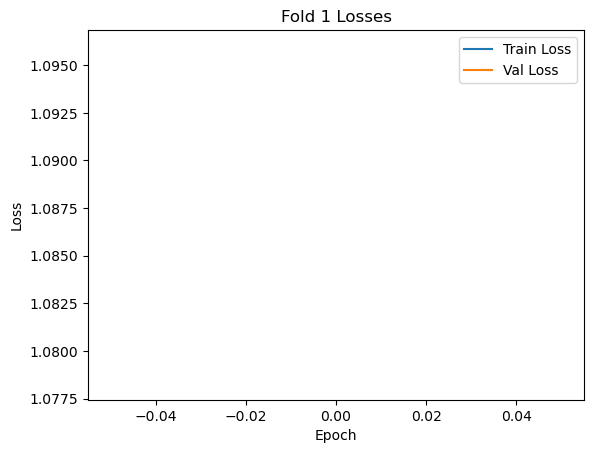


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


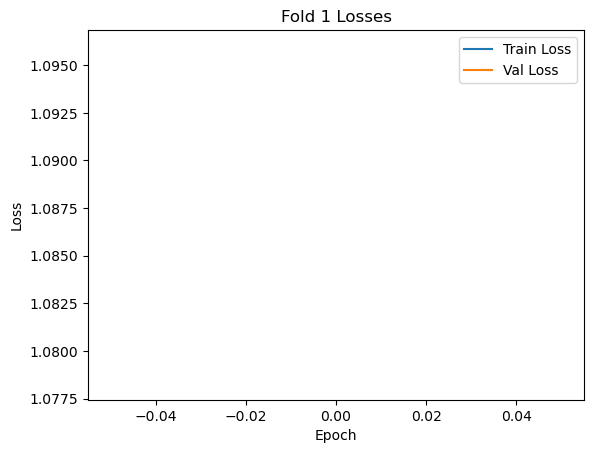

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


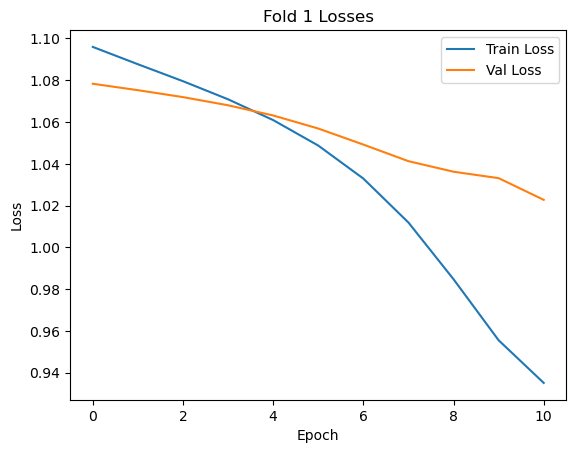


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


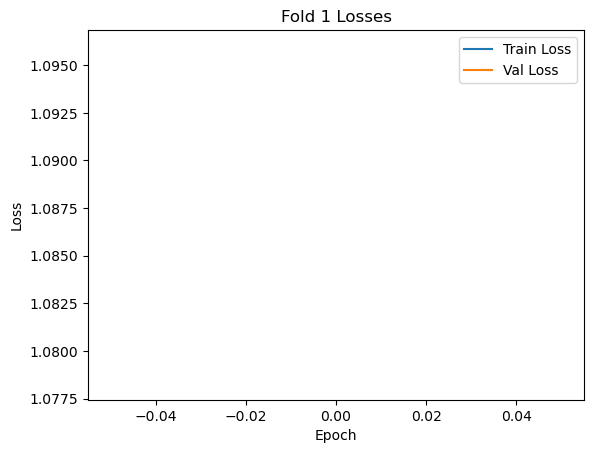

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


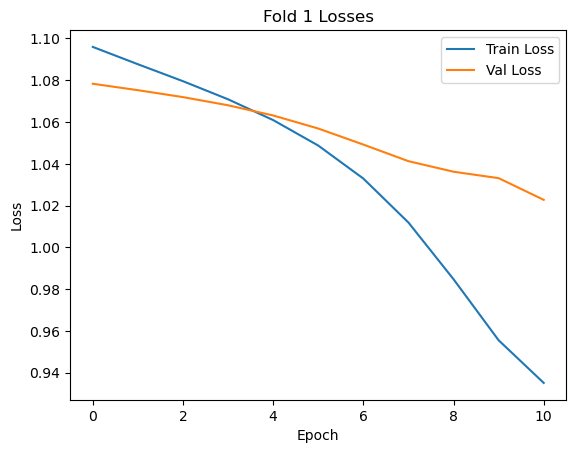

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


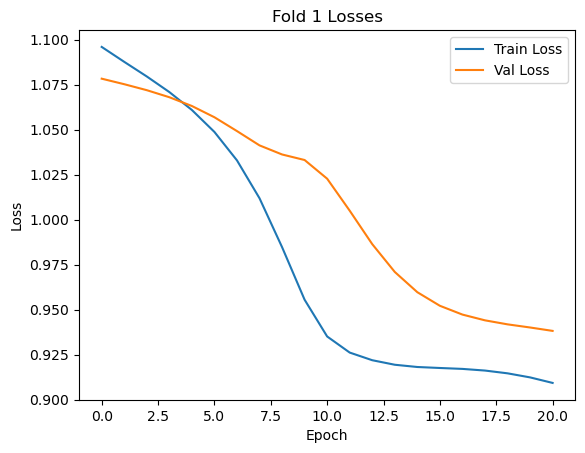


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


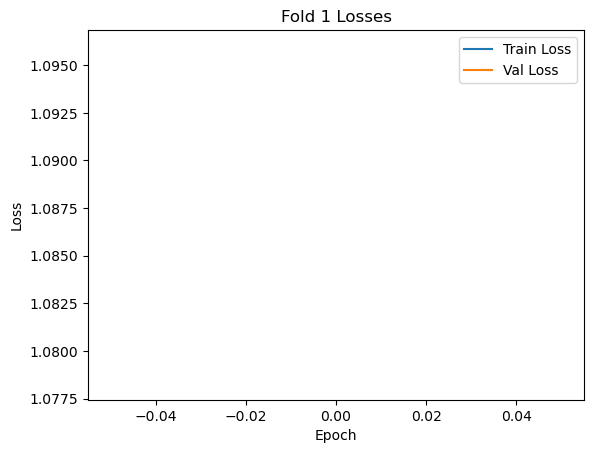

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


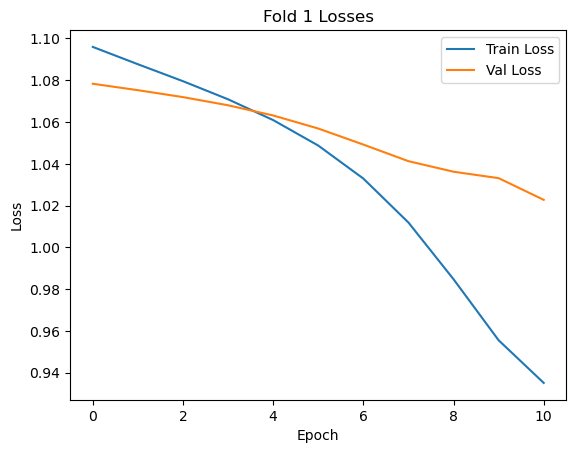

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


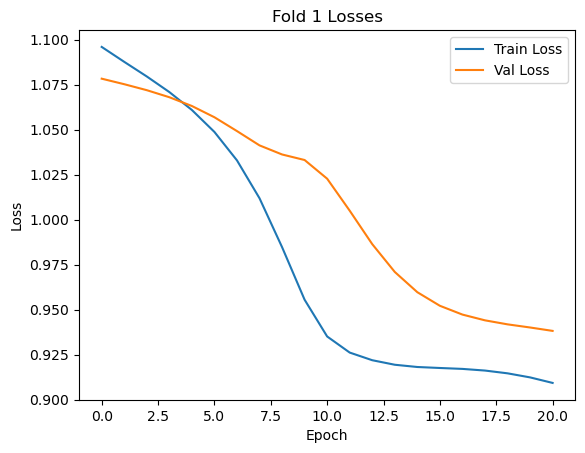

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


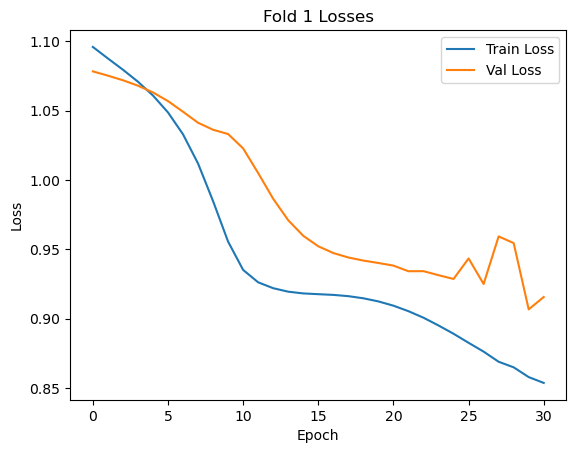


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


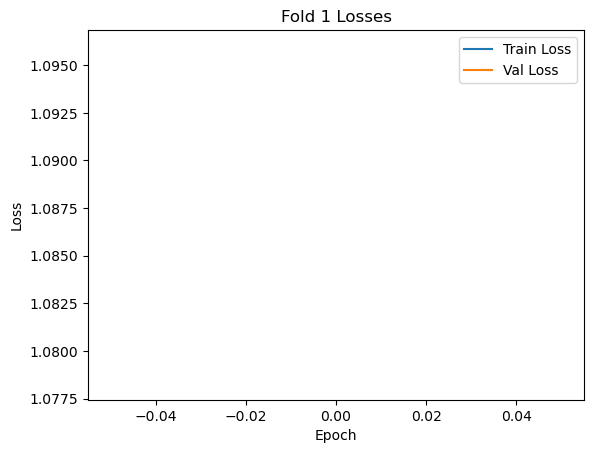

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


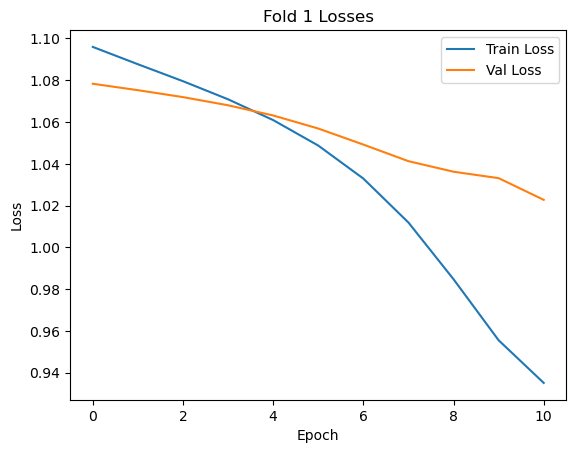

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


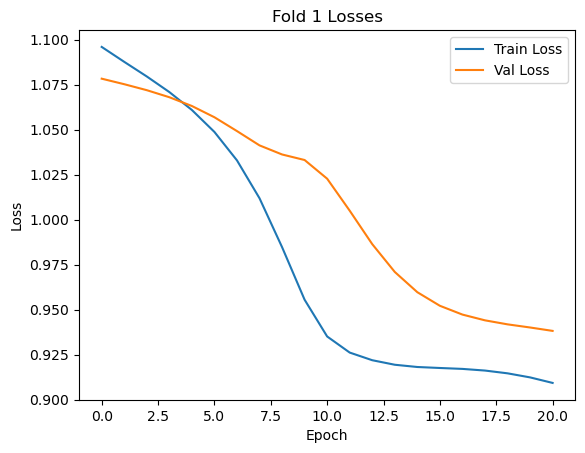

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


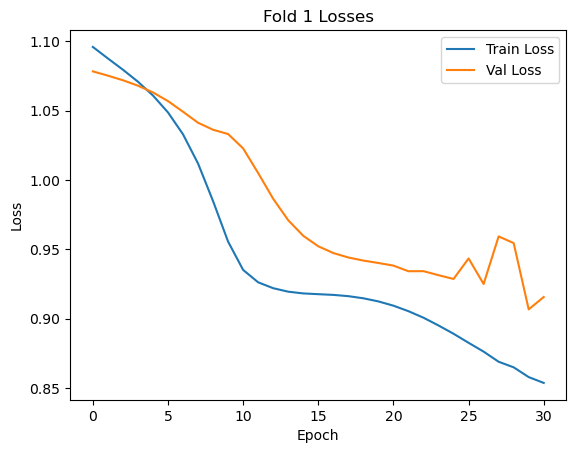

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


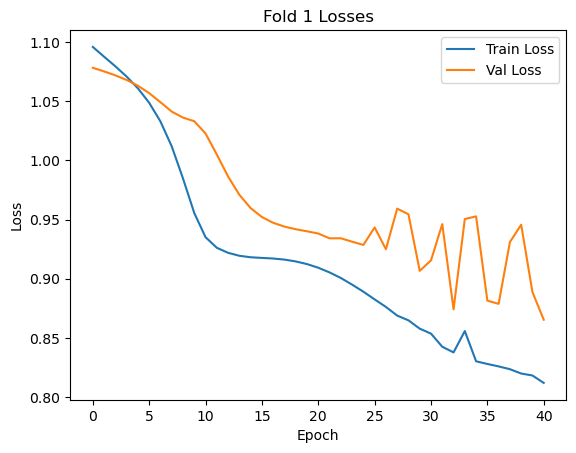


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


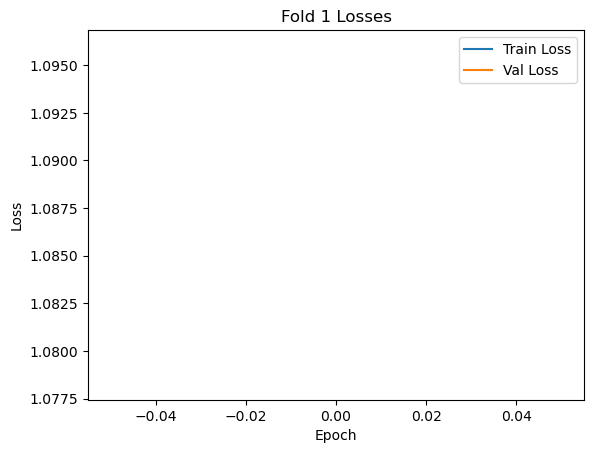

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


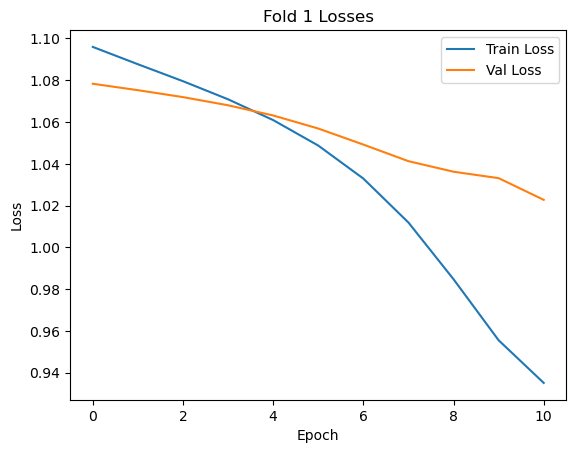

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


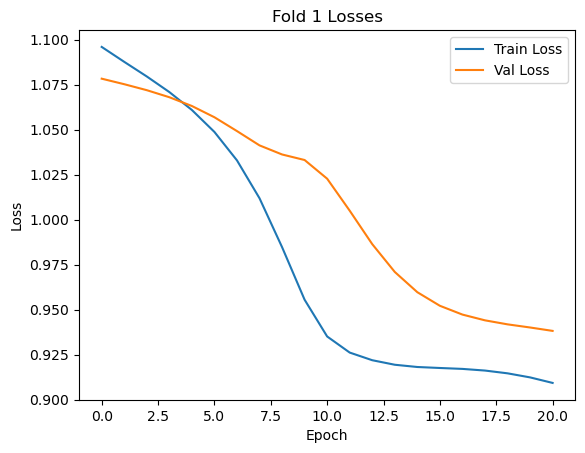

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


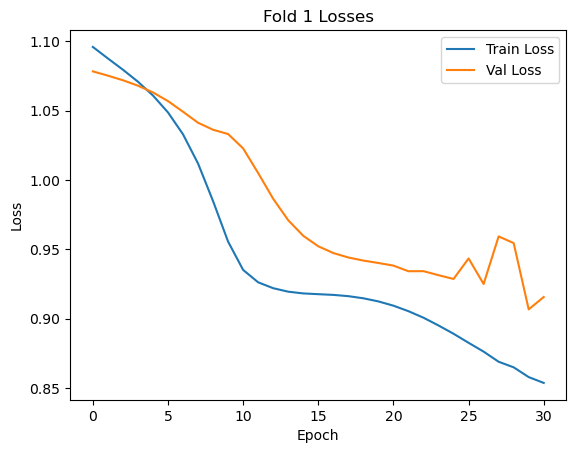

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


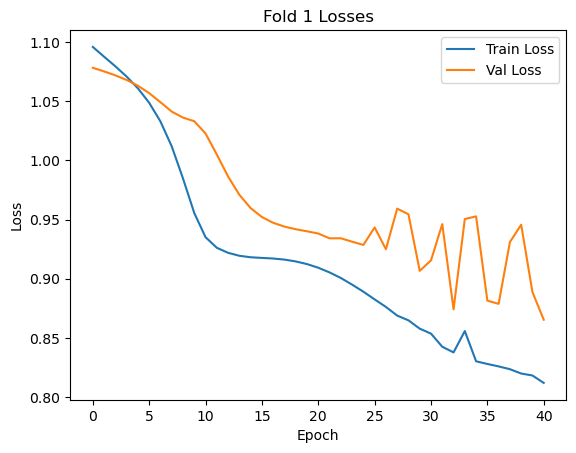

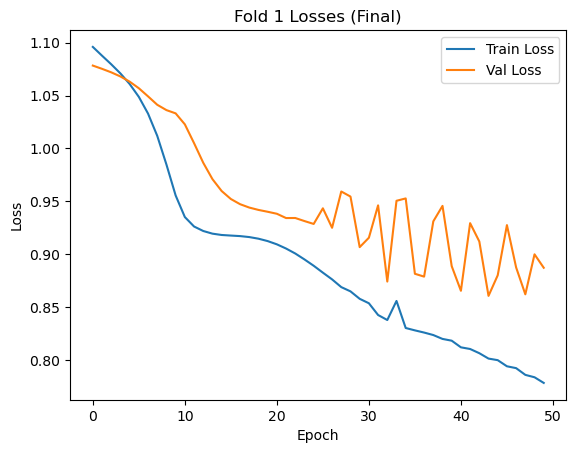


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


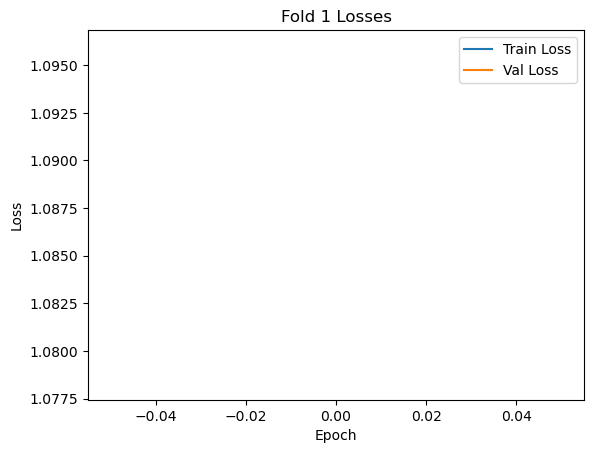

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


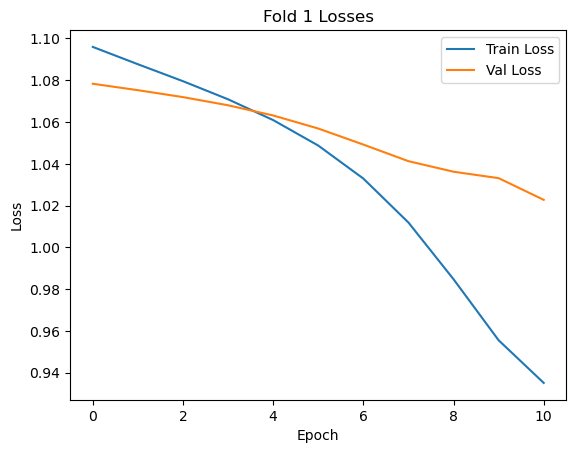

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


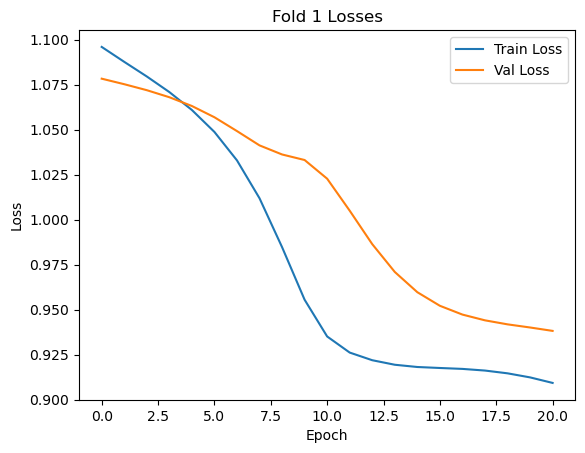

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


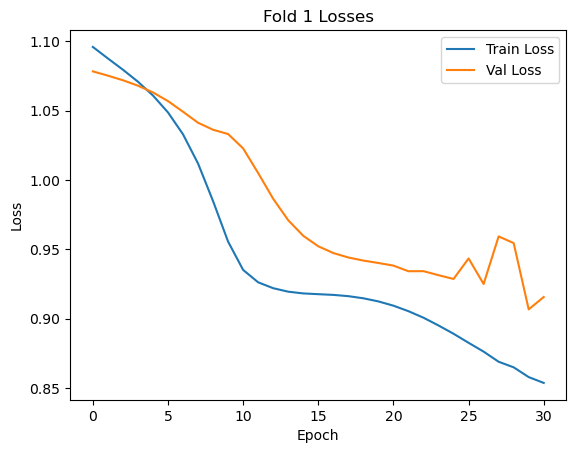

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


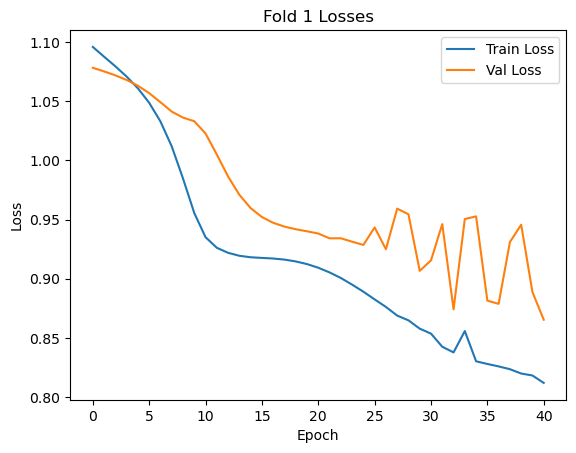

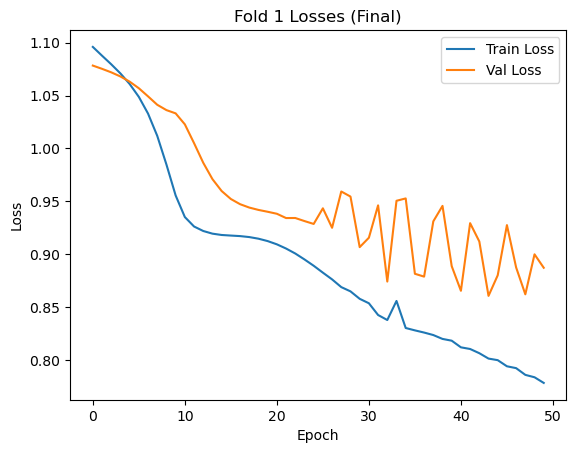

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685



Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


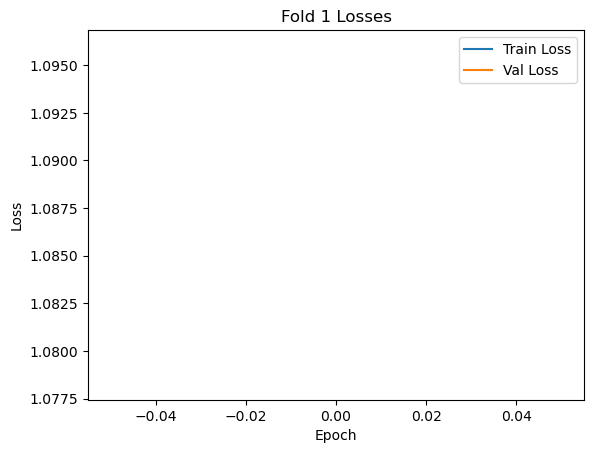

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


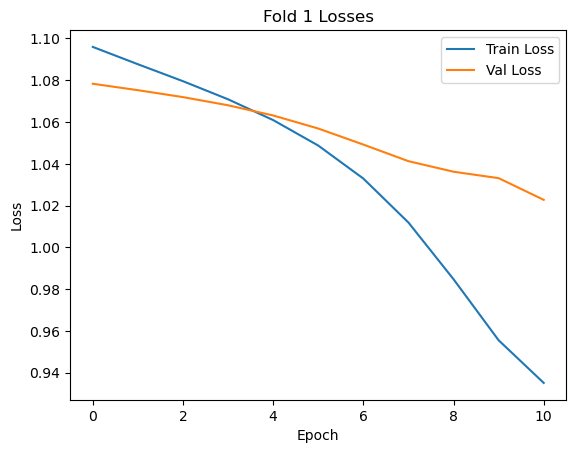

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


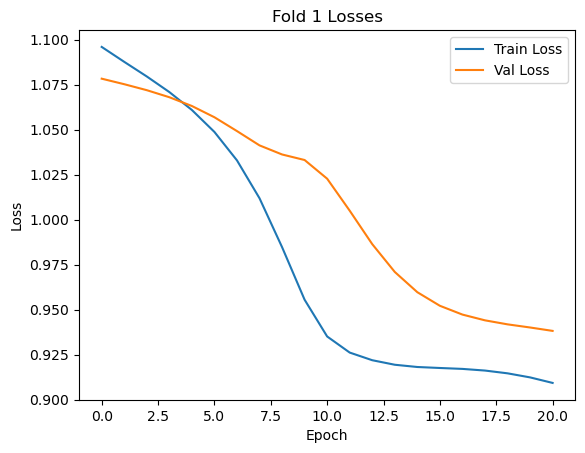

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


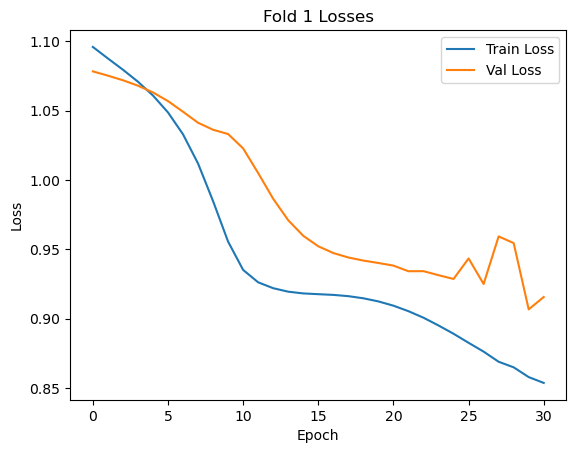

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


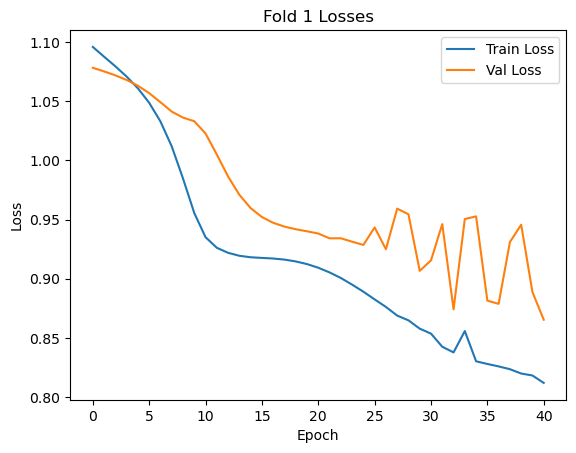

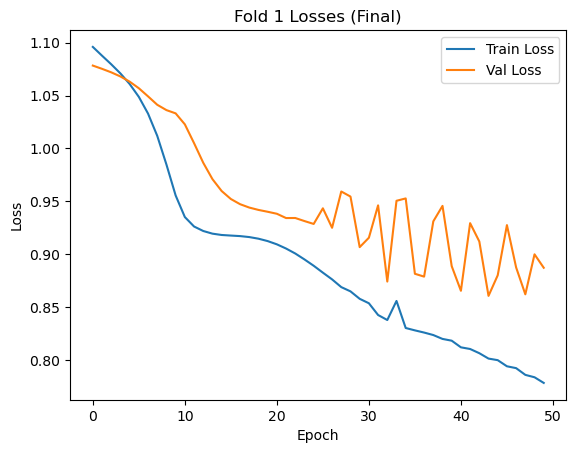

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


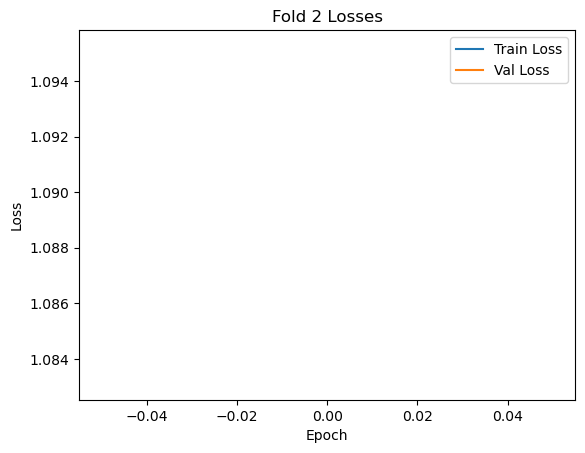


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


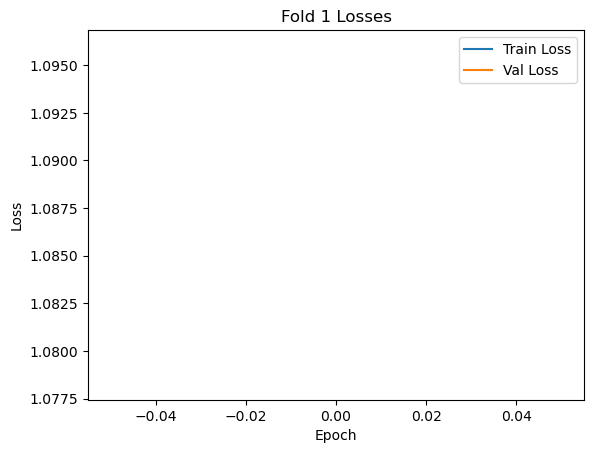

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


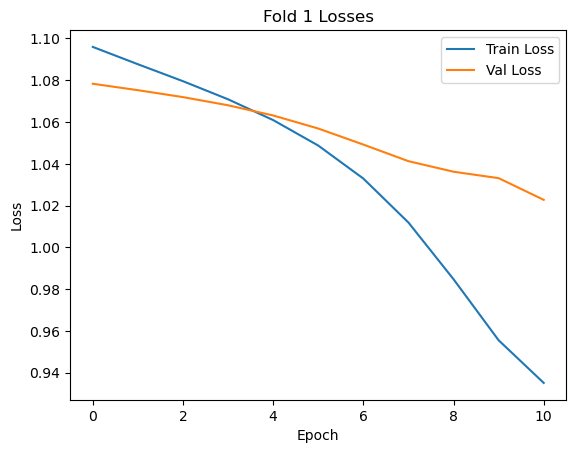

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


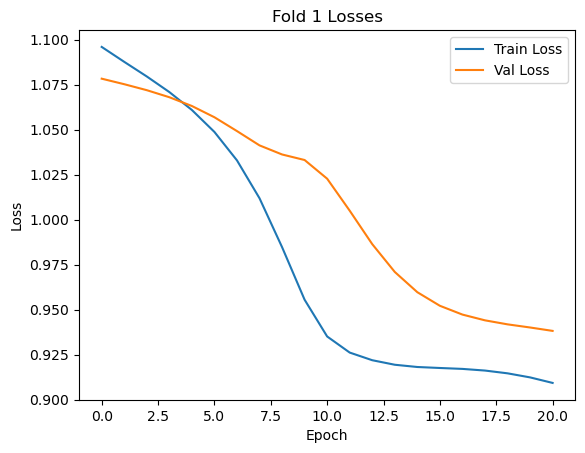

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


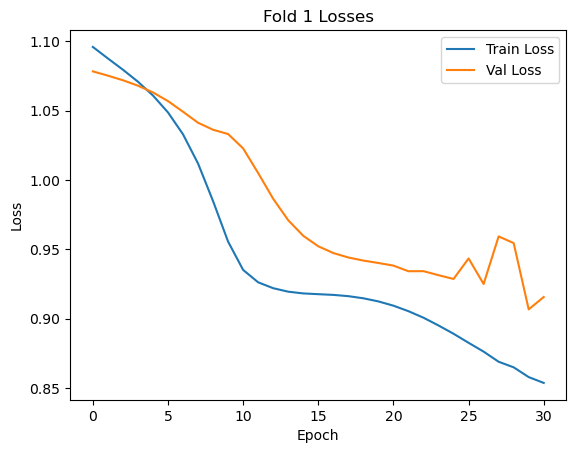

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


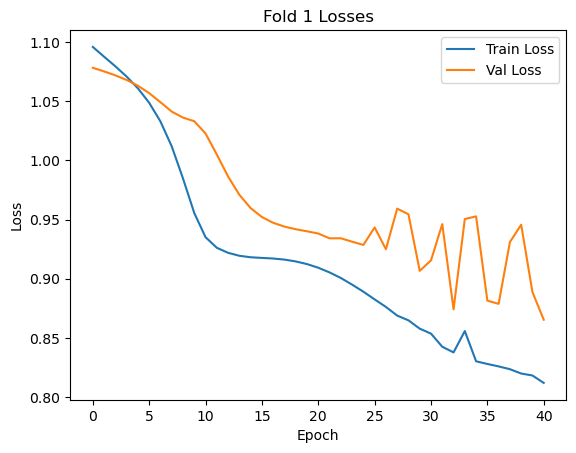

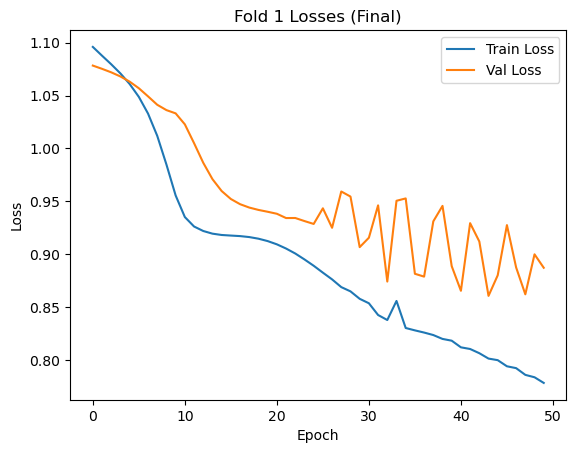

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


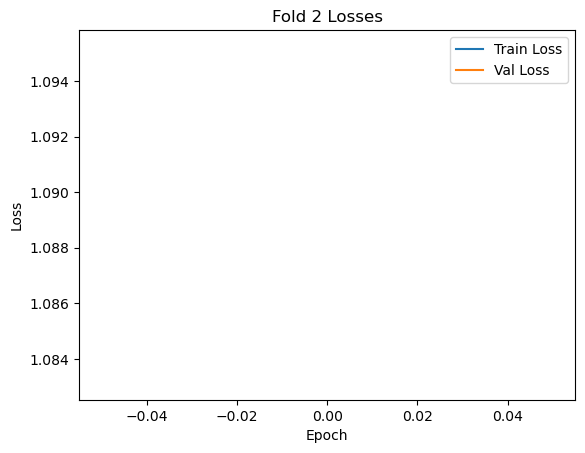

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


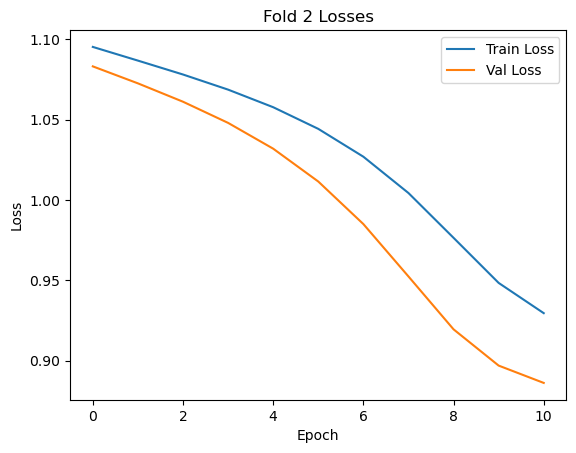


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


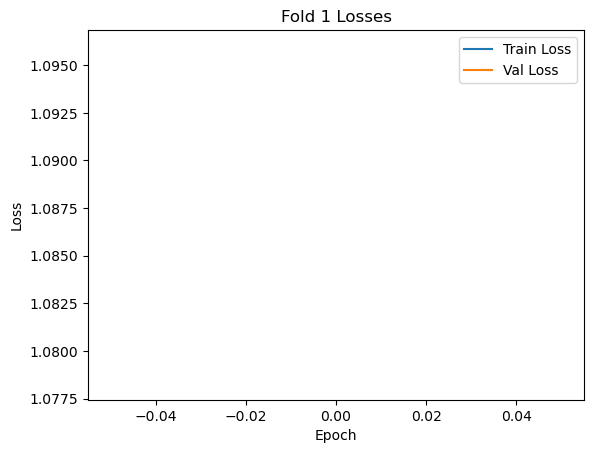

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


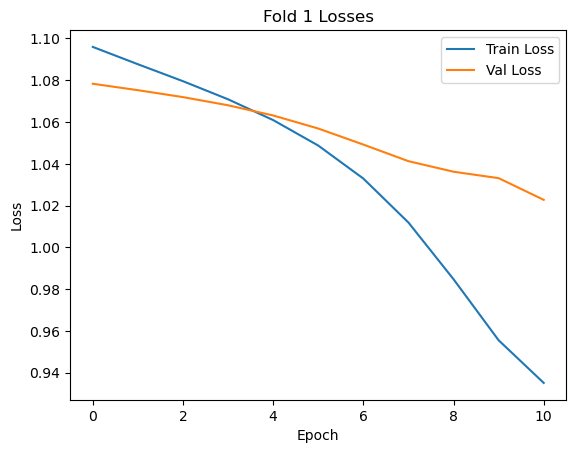

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


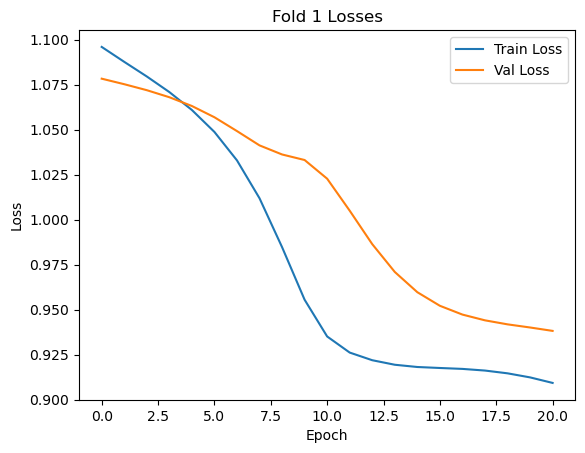

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


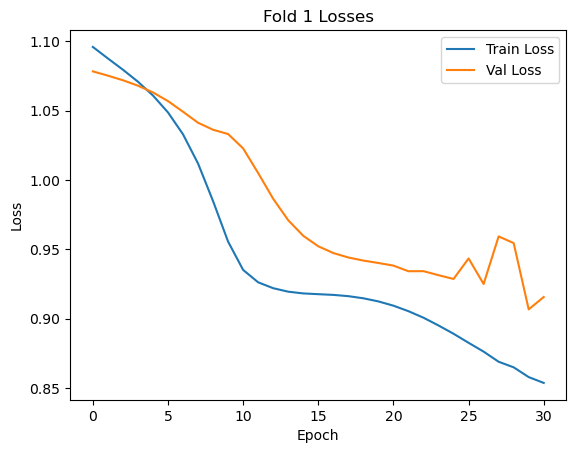

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


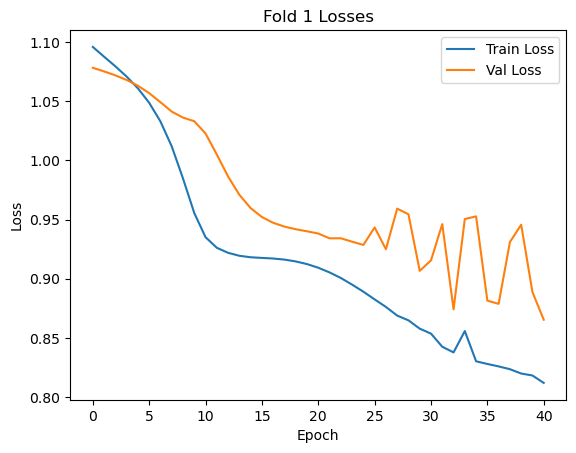

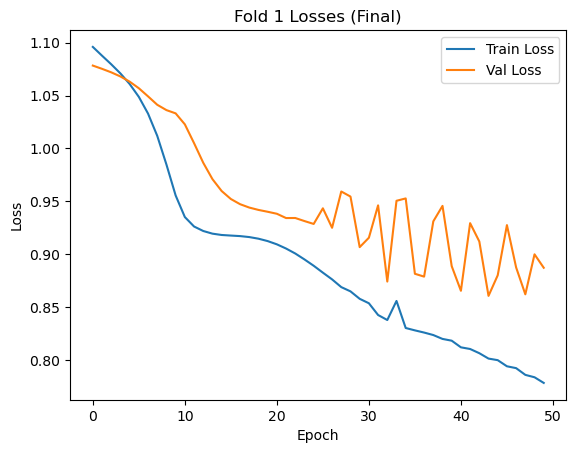

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


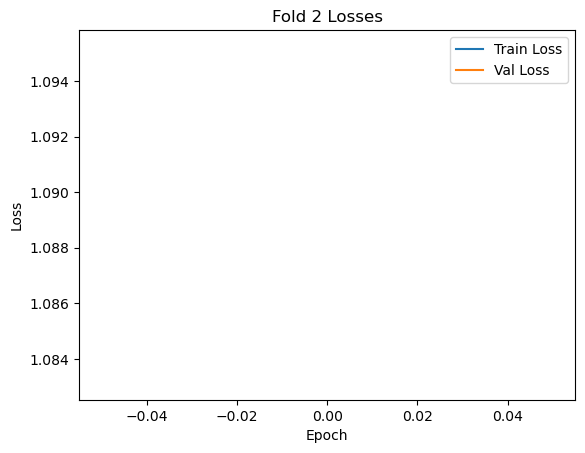

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


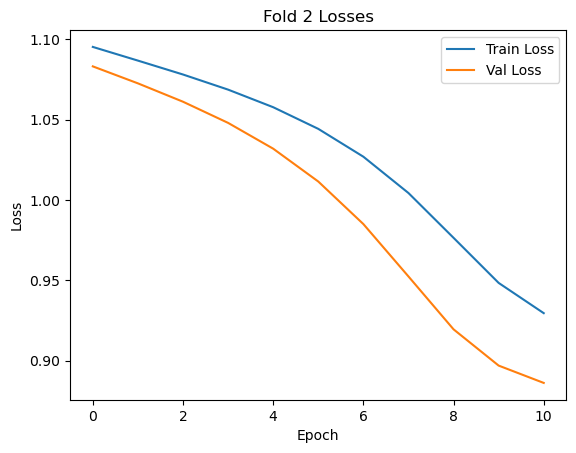

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


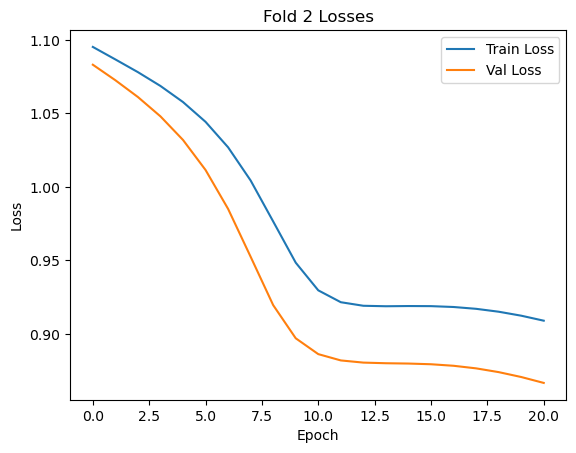


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


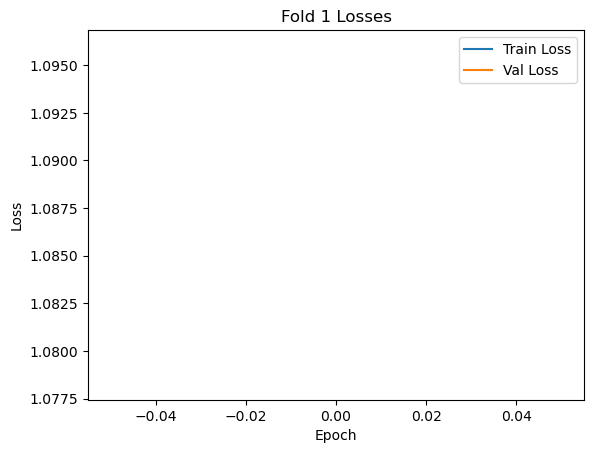

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


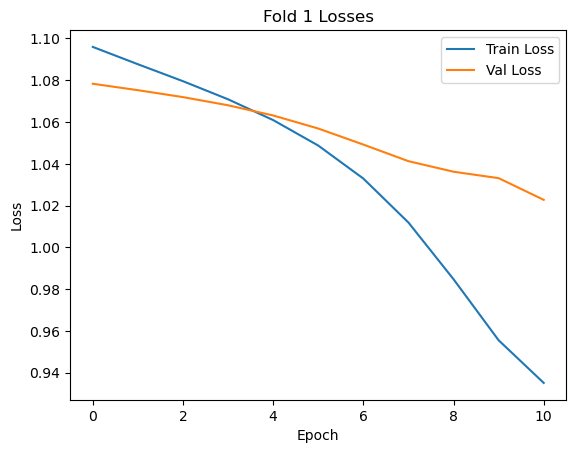

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


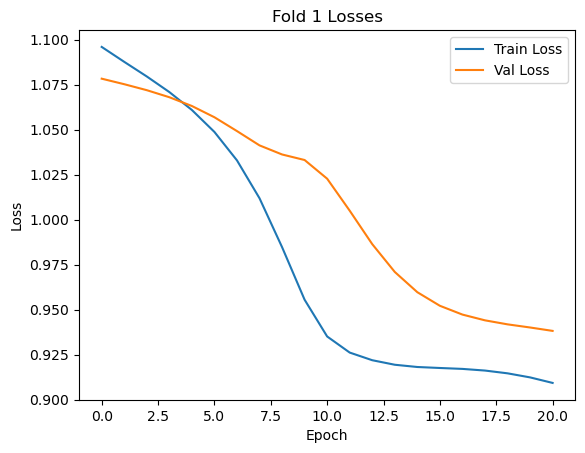

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


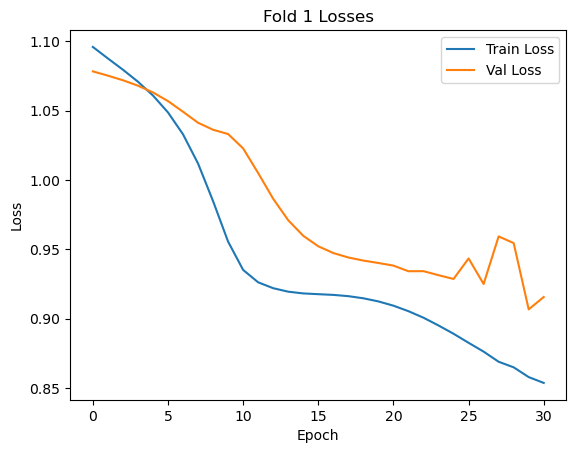

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


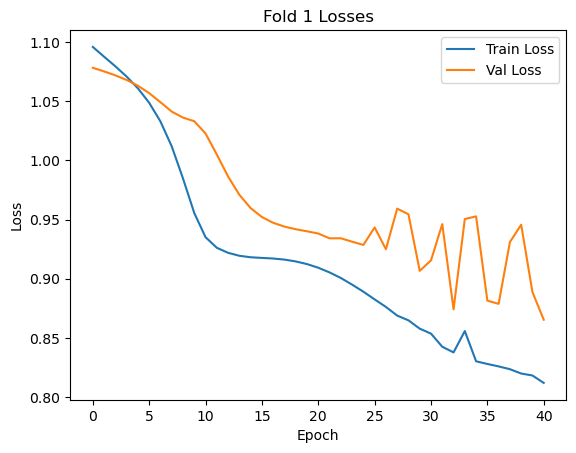

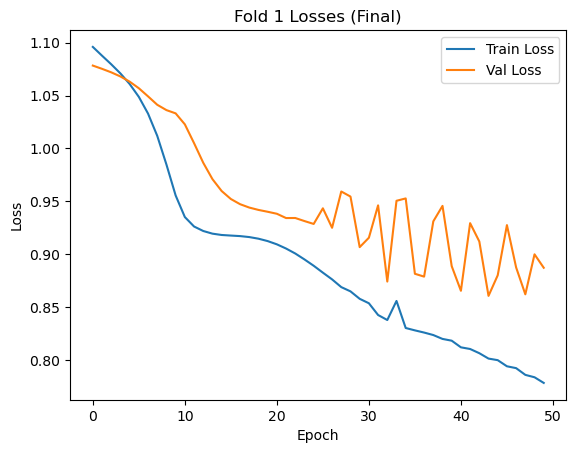

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


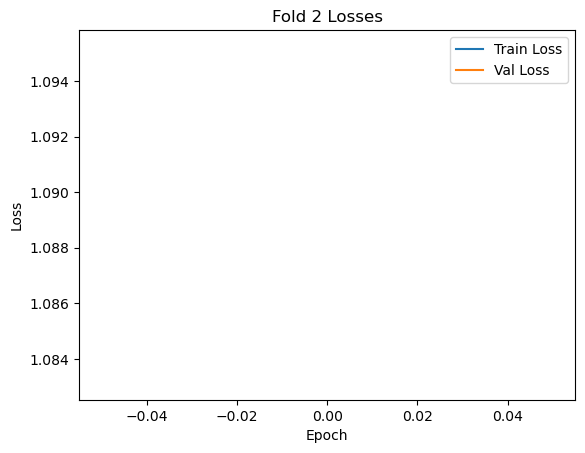

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


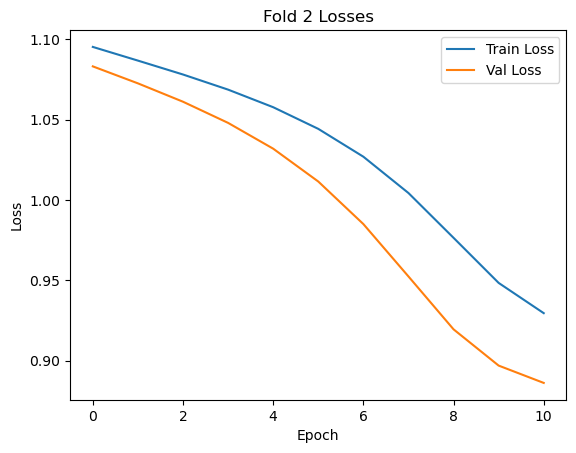

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


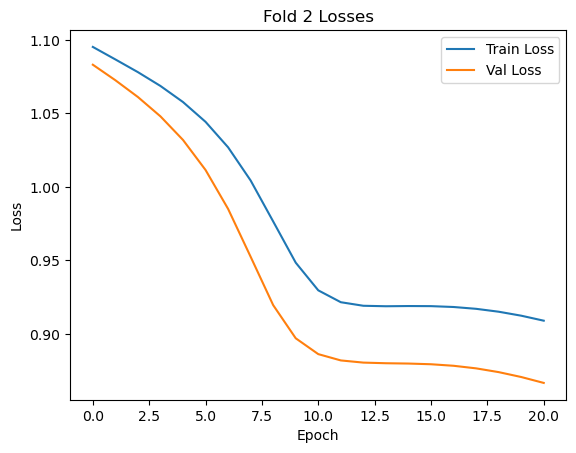

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


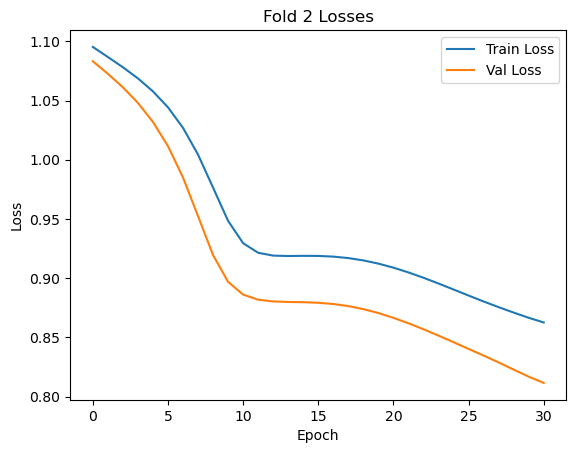


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


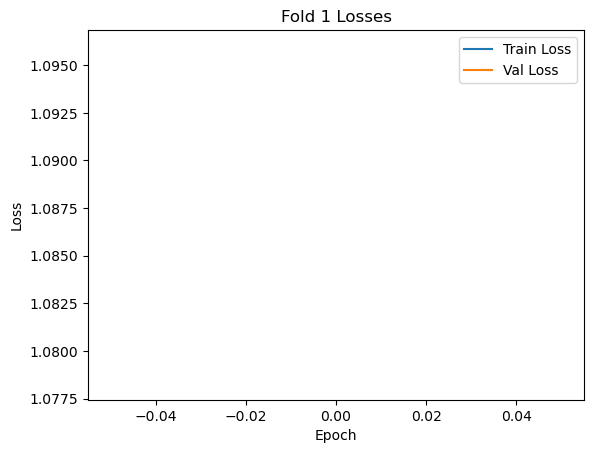

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


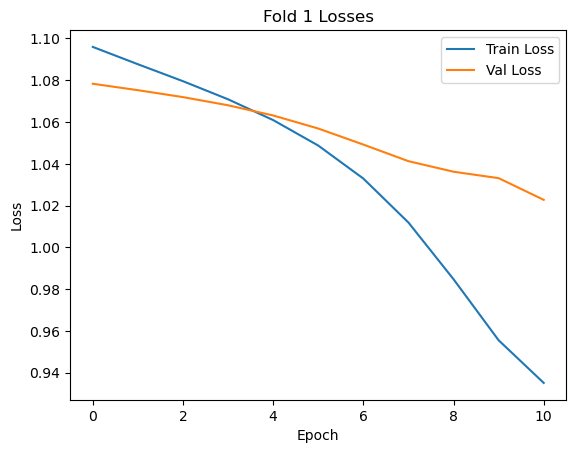

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


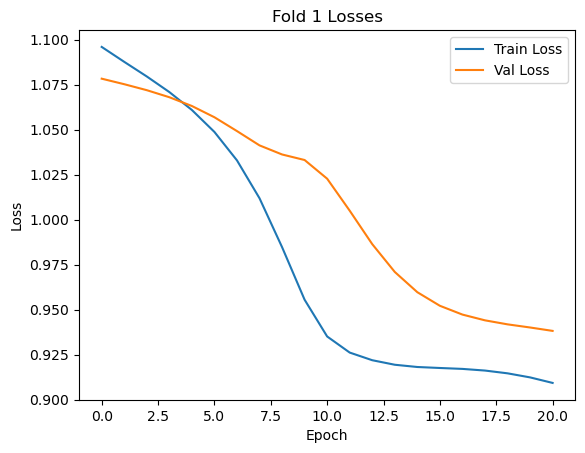

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


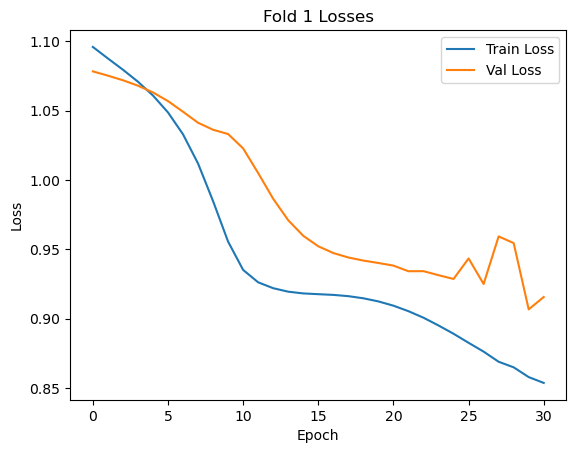

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


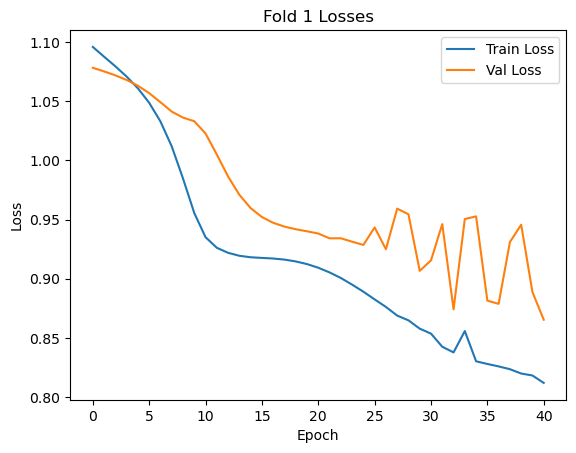

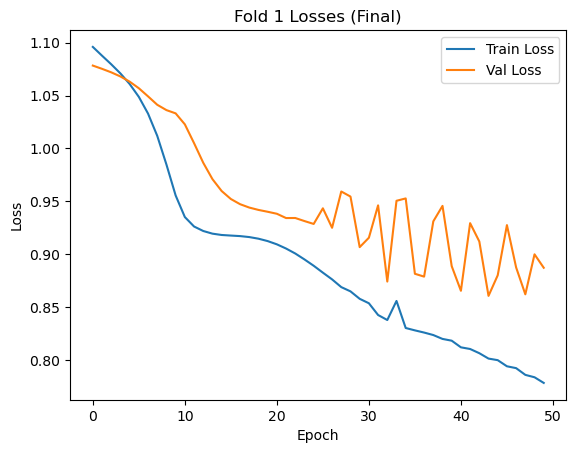

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


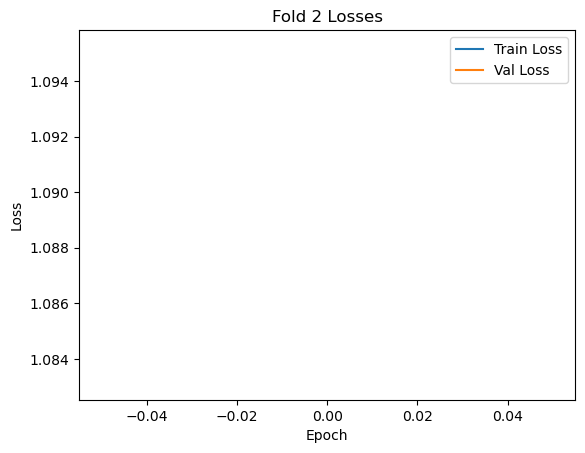

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


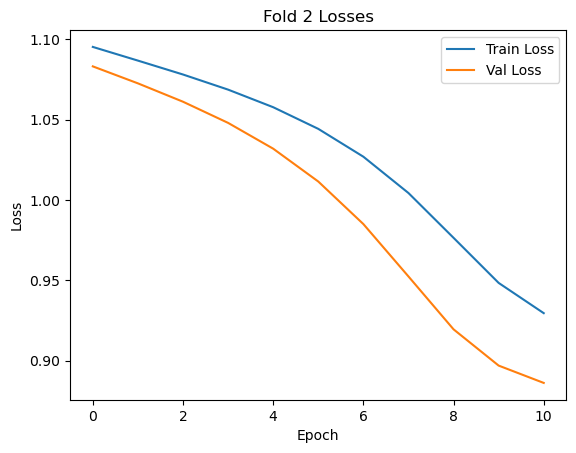

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


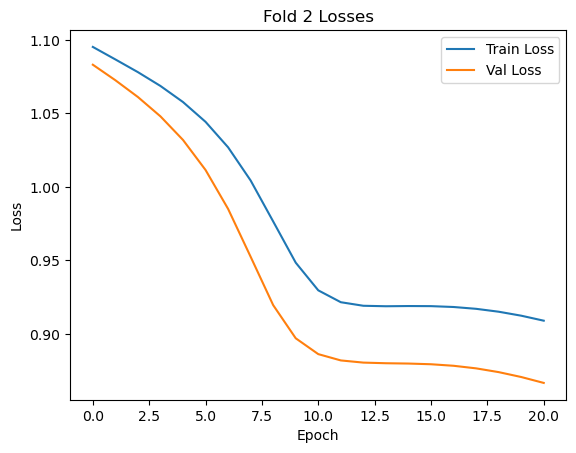

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


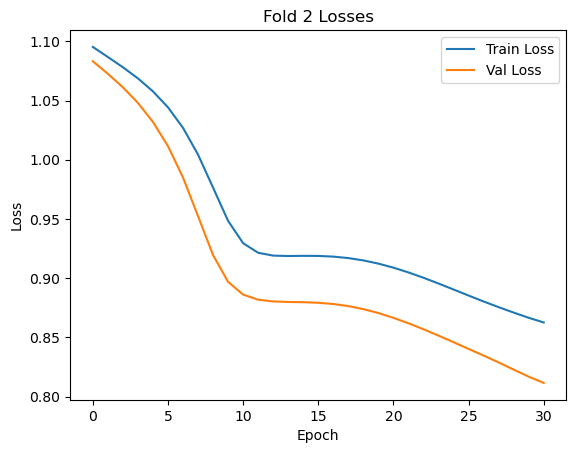

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


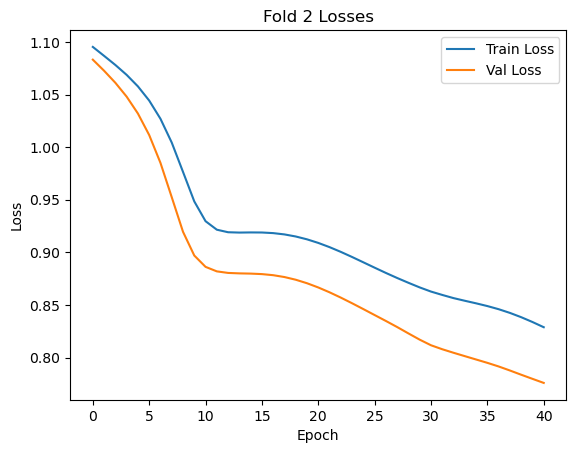


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


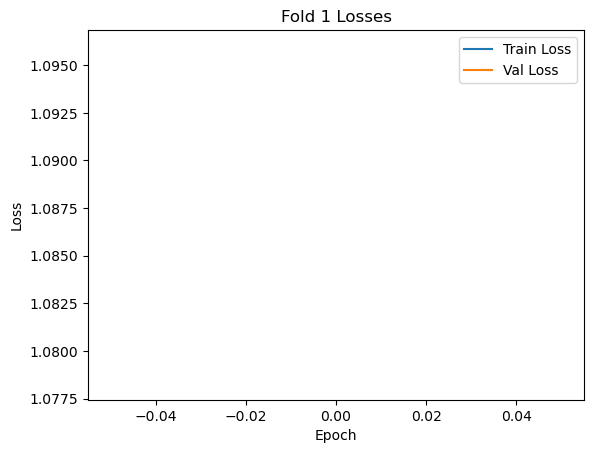

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


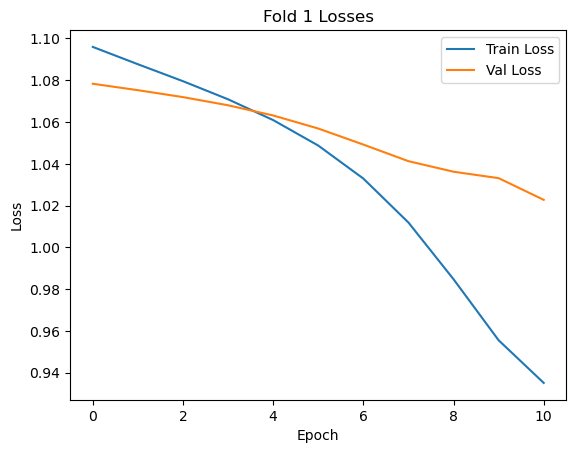

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


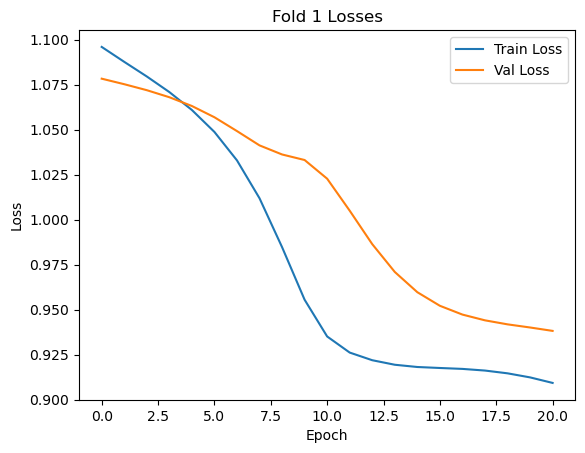

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


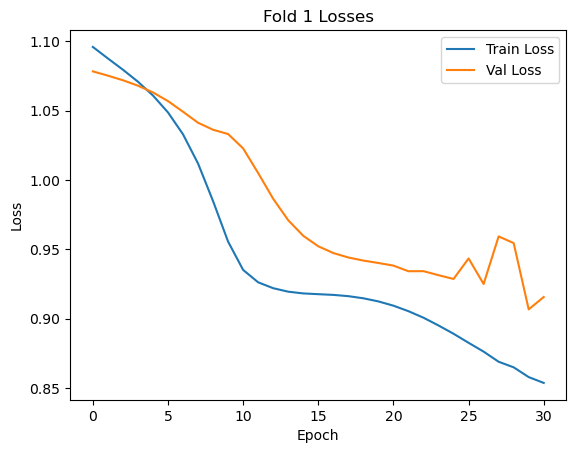

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


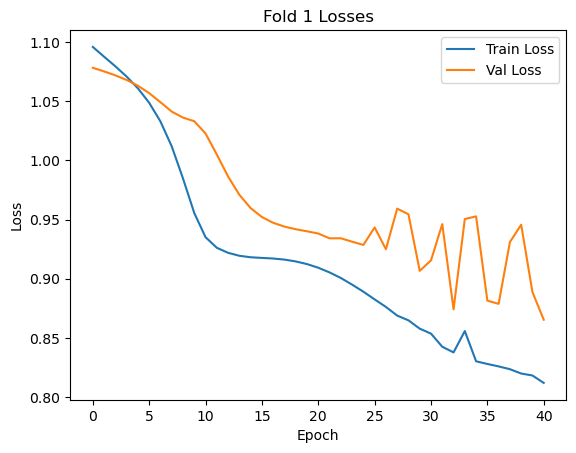

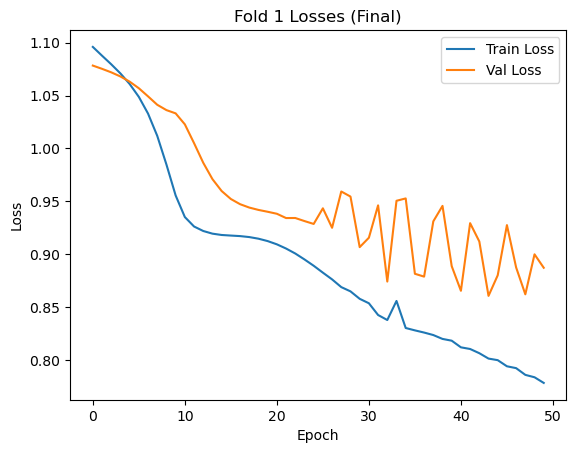

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


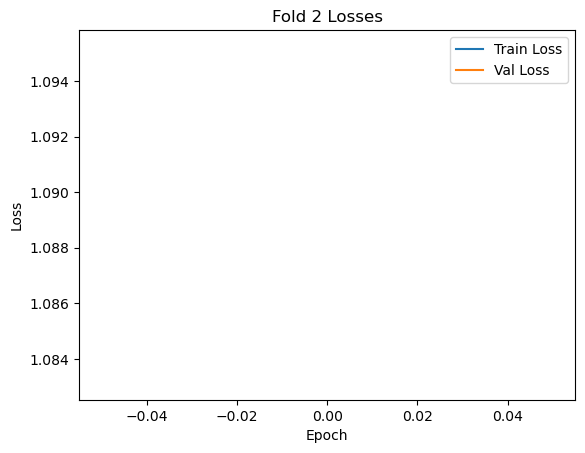

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


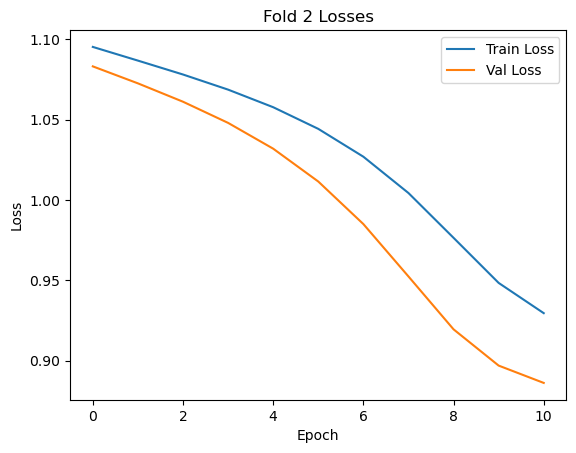

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


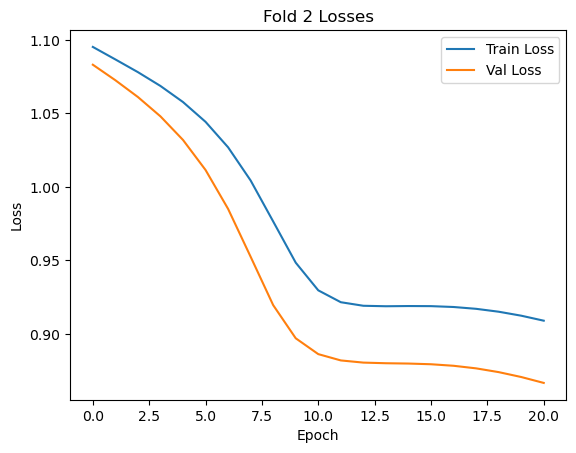

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


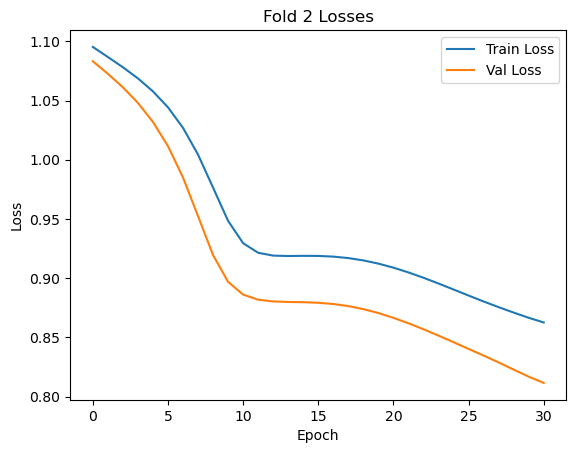

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


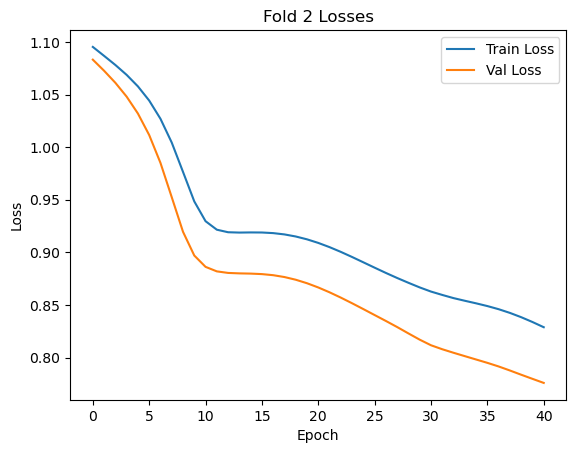

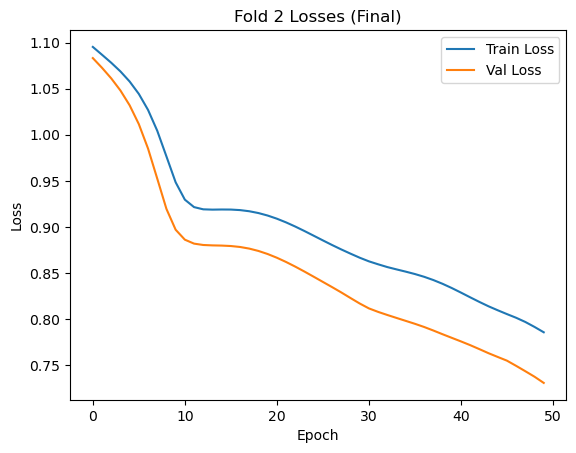


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


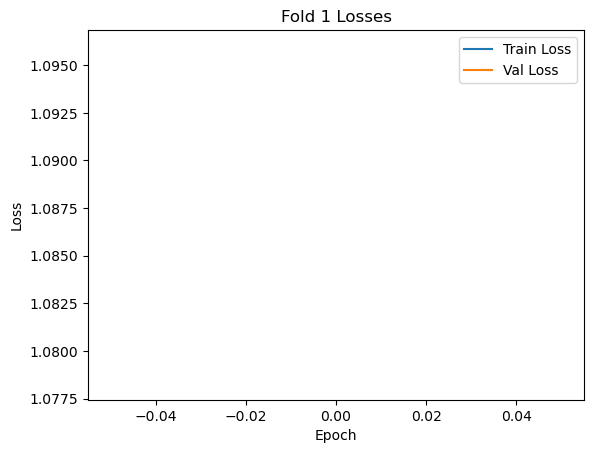

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


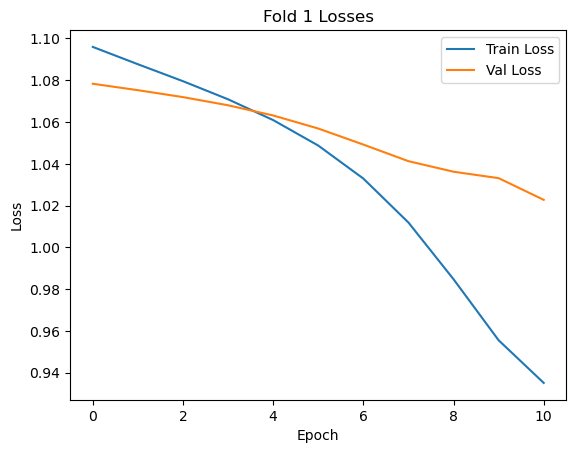

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


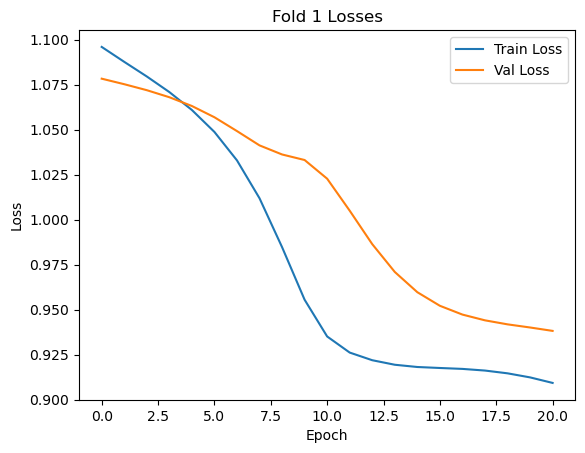

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


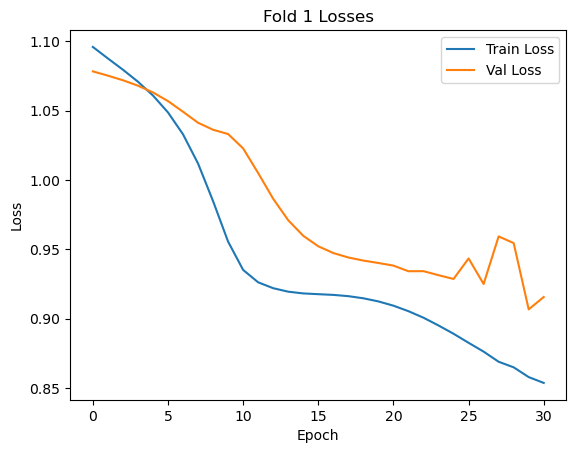

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


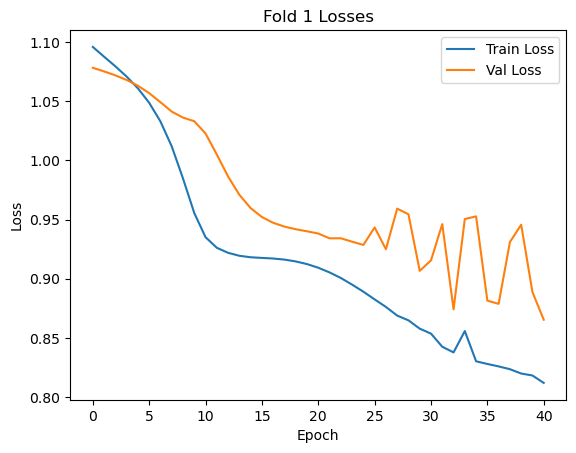

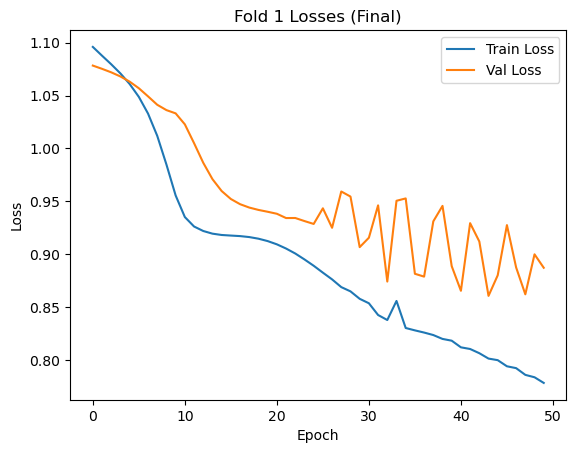

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


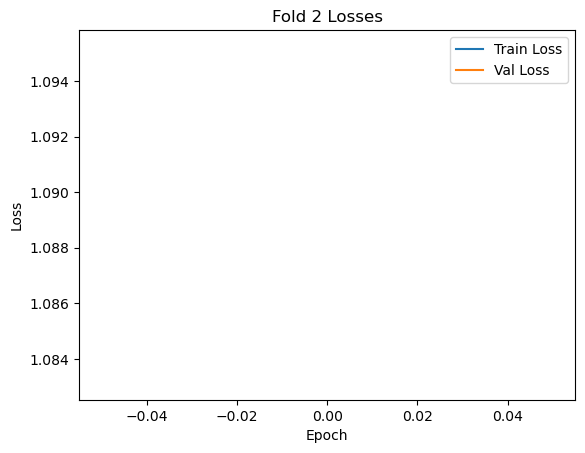

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


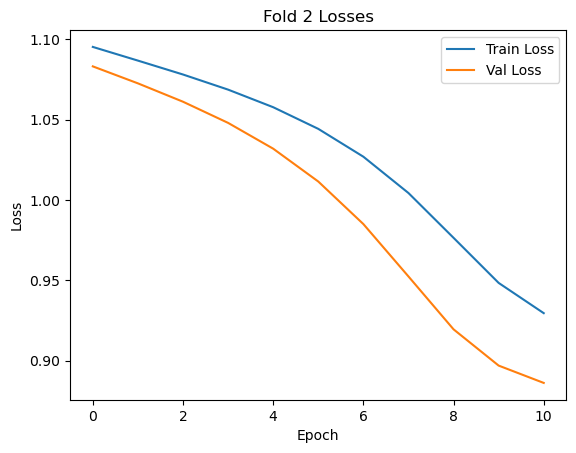

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


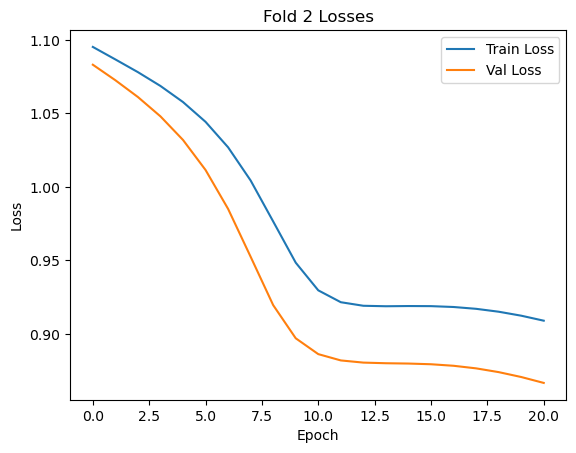

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


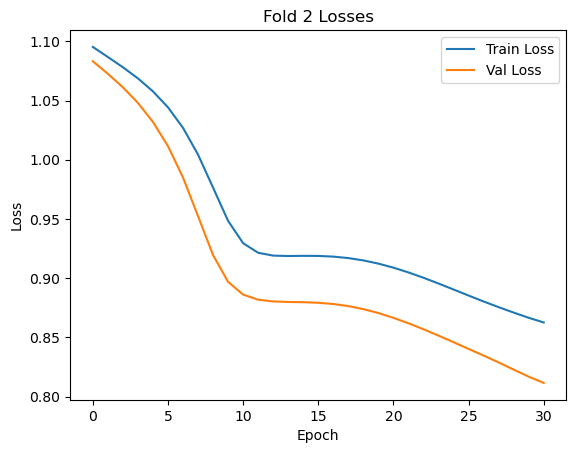

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


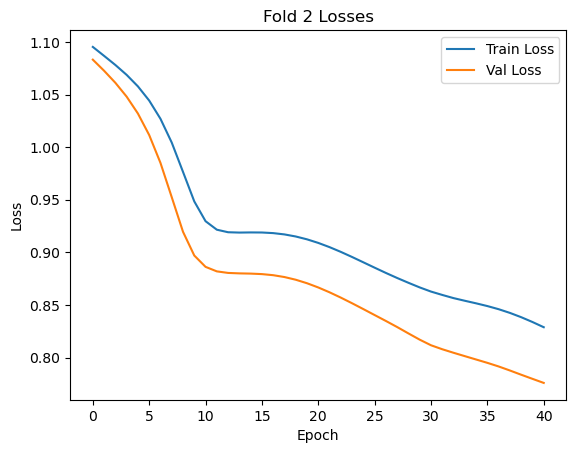

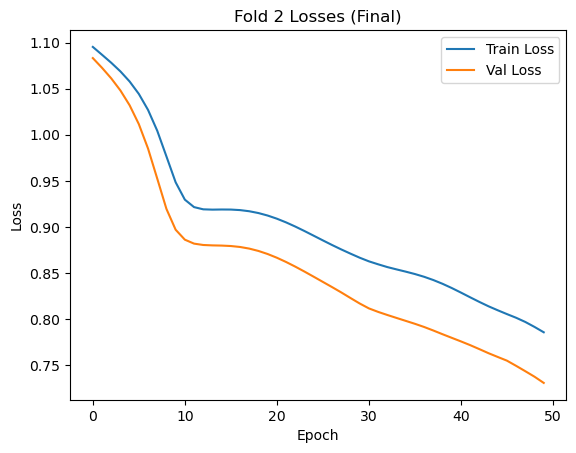

Validation accuracy for fold 2: 0.6154

Fold 3/5
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312



Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


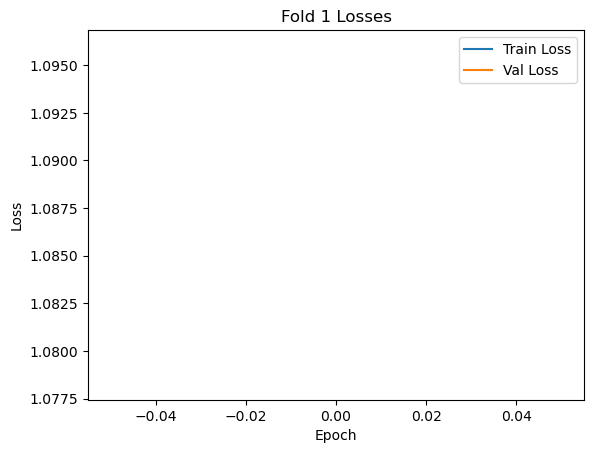

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


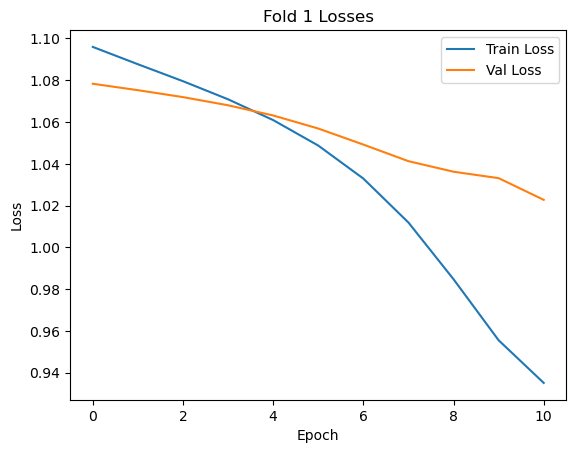

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


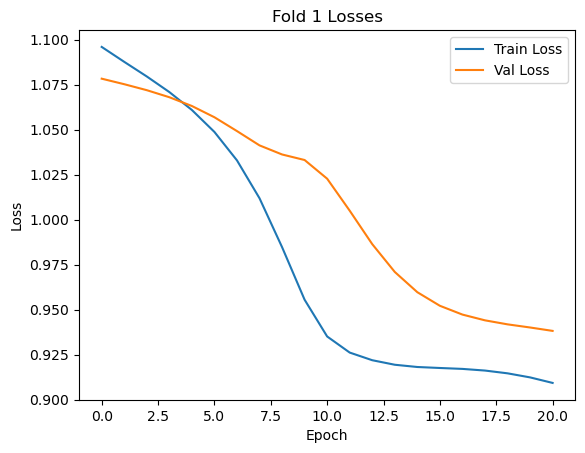

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


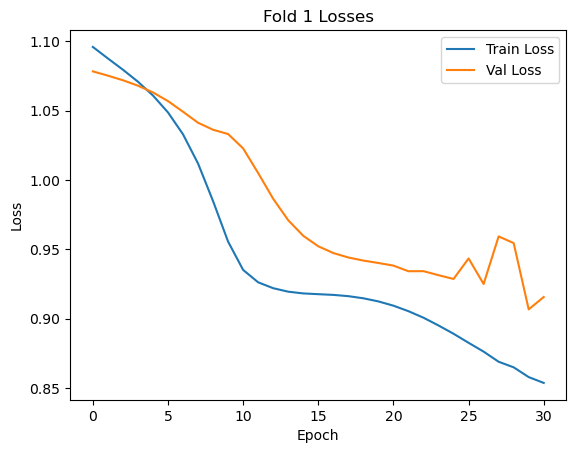

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


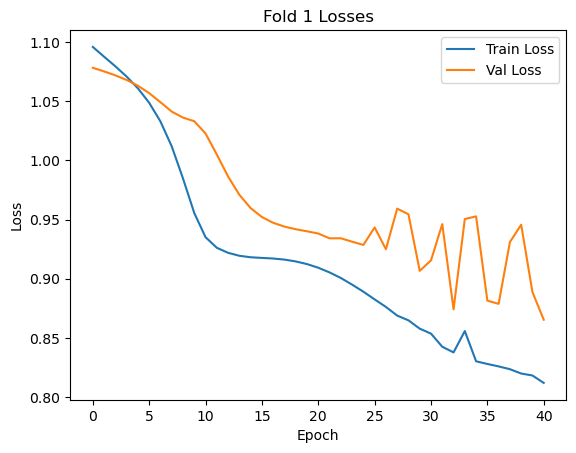

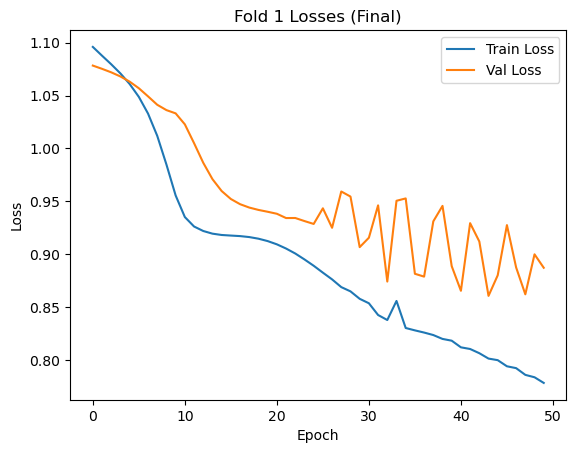

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


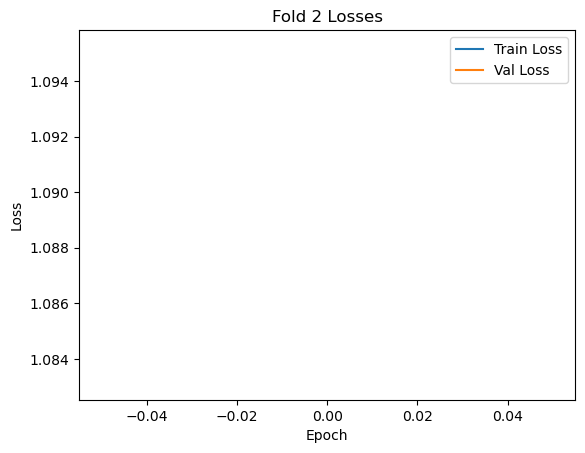

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


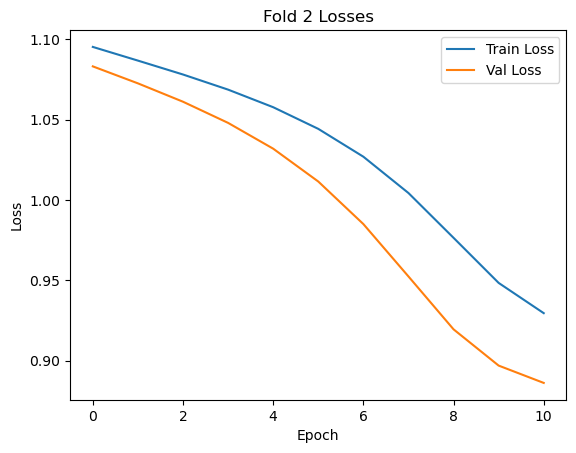

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


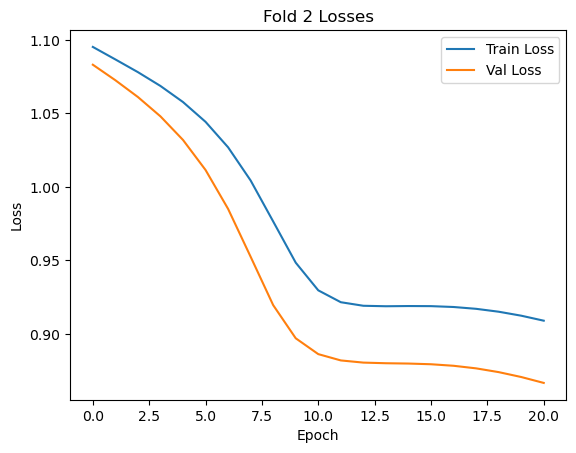

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


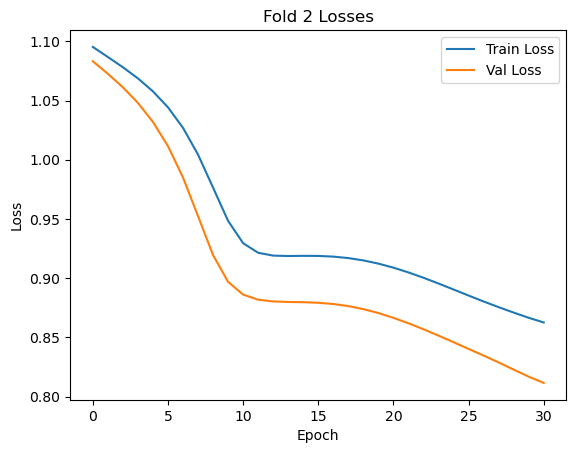

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


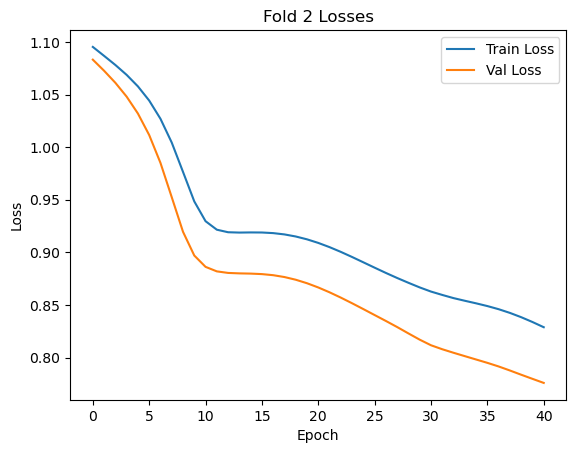

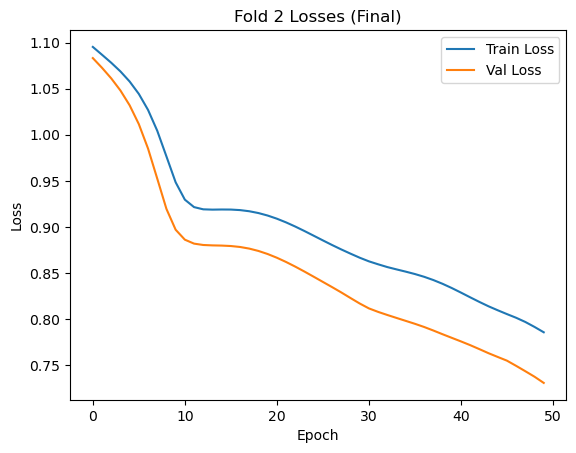

Validation accuracy for fold 2: 0.6154

Fold 3/5
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312


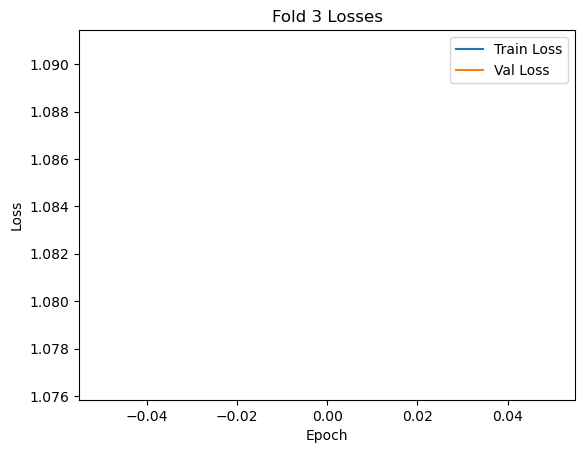


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


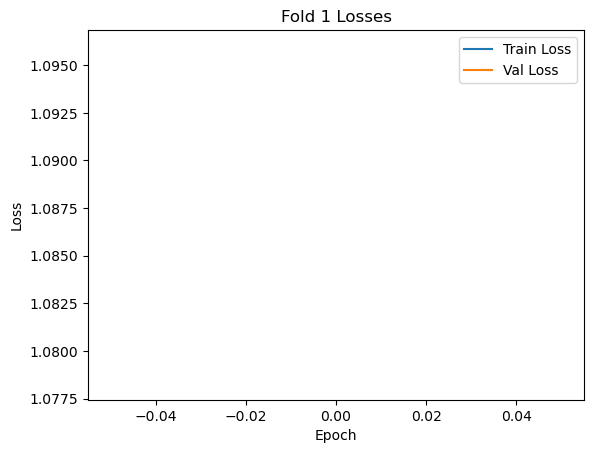

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


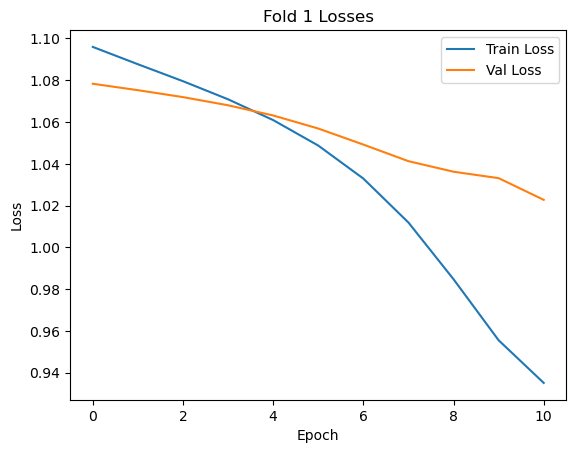

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


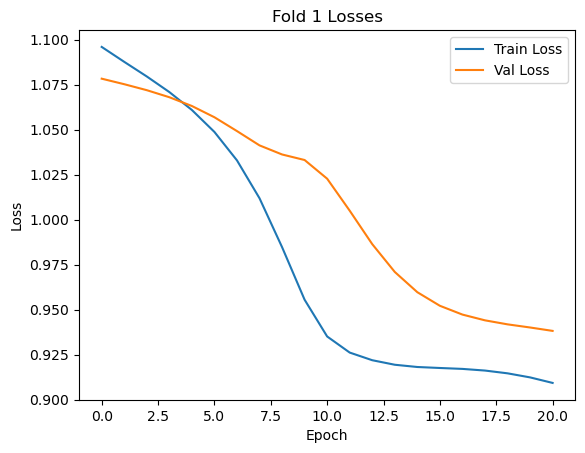

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


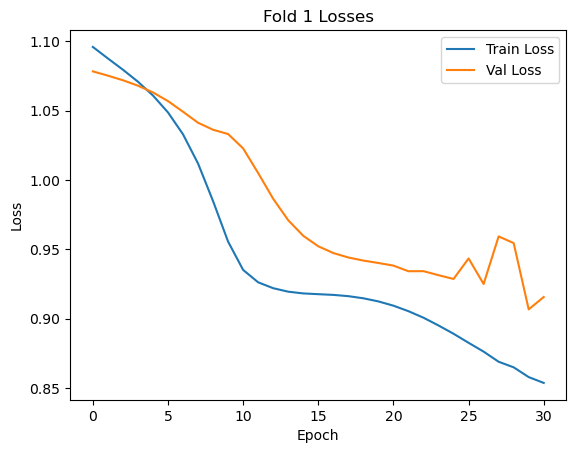

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


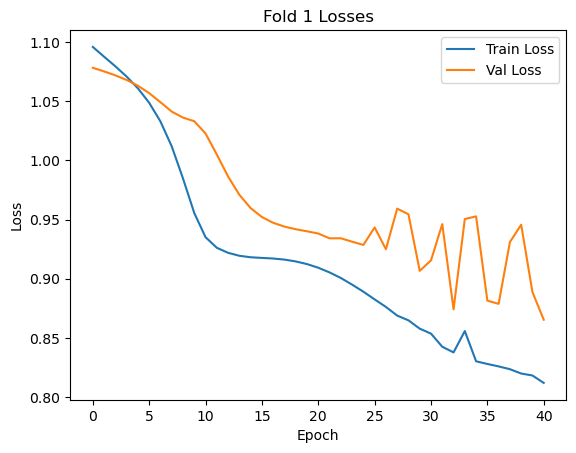

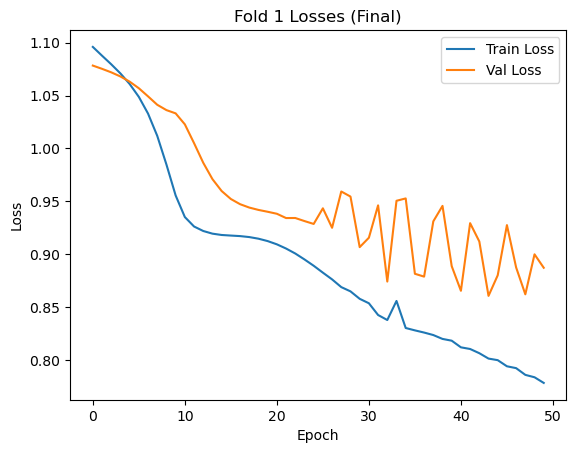

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


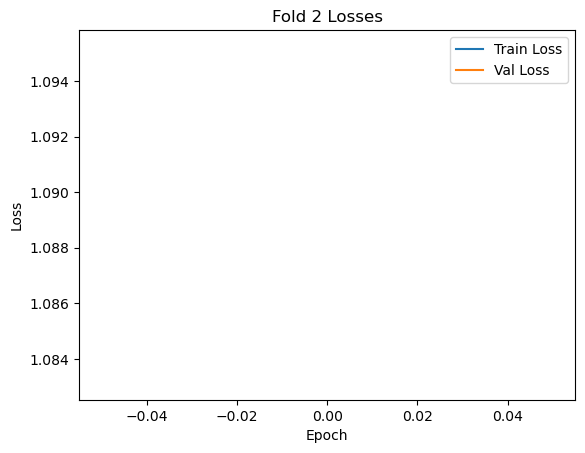

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


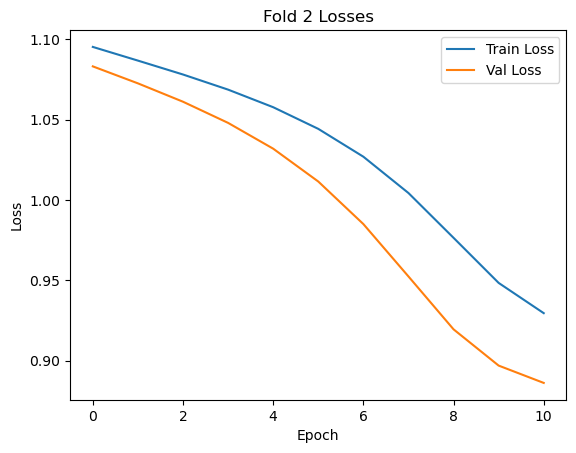

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


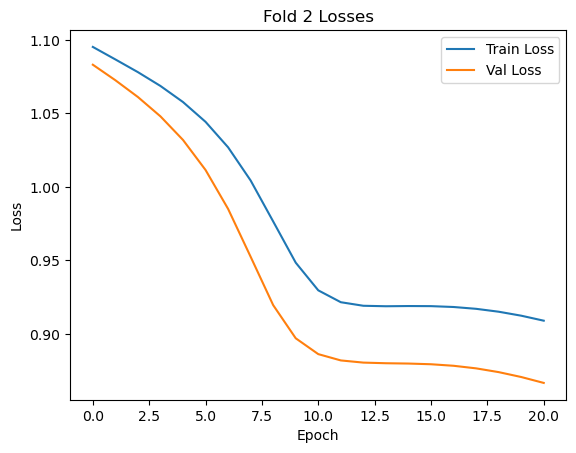

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


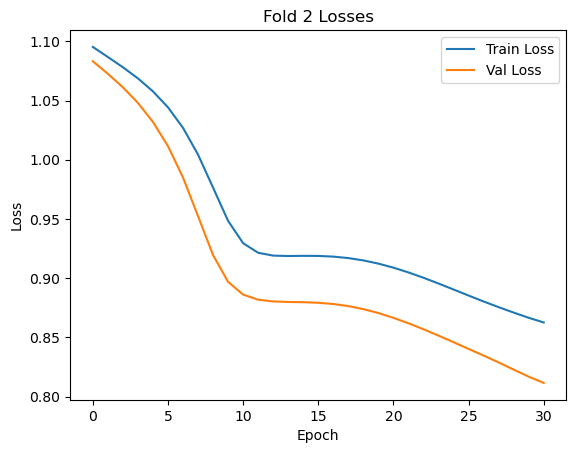

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


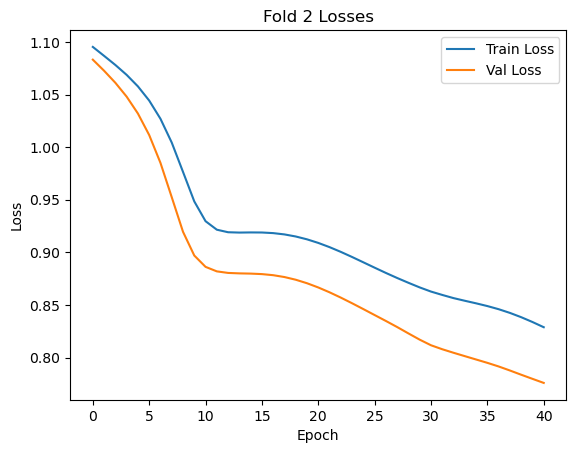

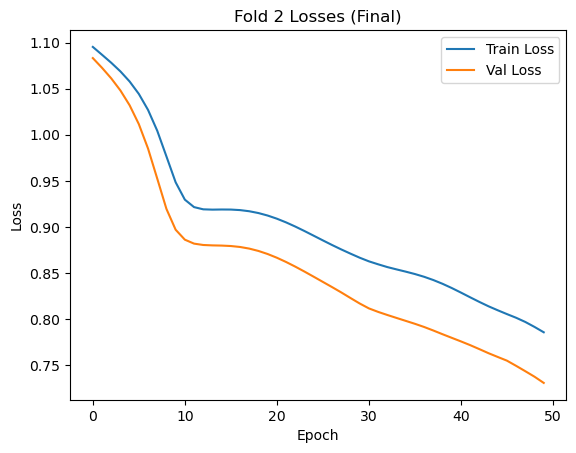

Validation accuracy for fold 2: 0.6154

Fold 3/5
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312


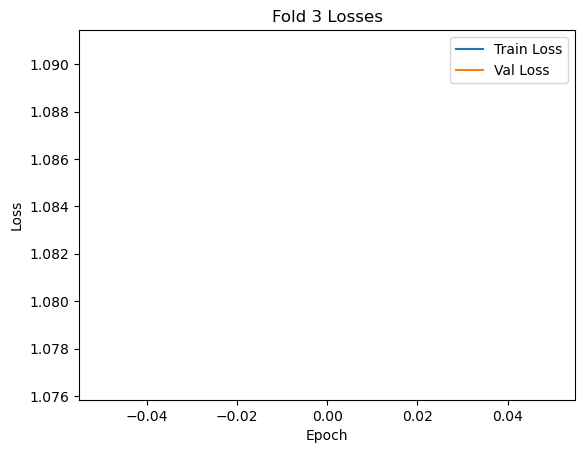

Epoch 10, Train Loss: 0.924263596534729, Val Loss: 0.8907445669174194


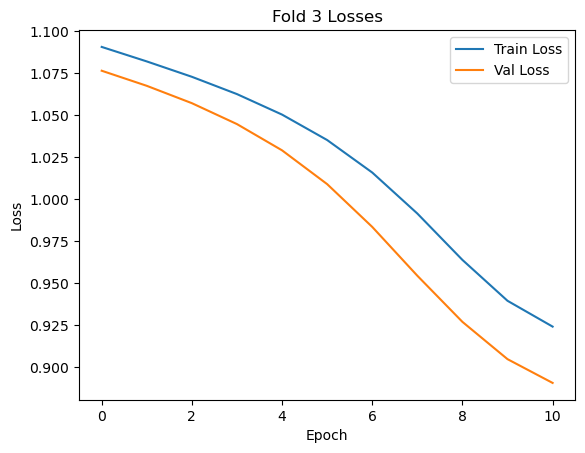


Fold 1/5
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991
Epoch 0, Train Loss: 1.095963478088379, Val Loss: 1.0783189535140991


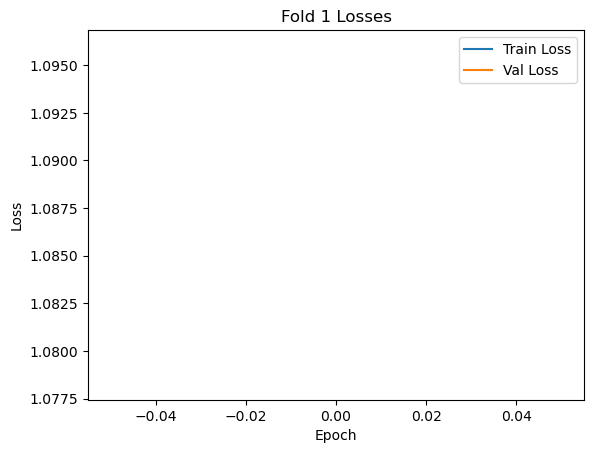

Epoch 10, Train Loss: 0.9350727796554565, Val Loss: 1.0227429866790771


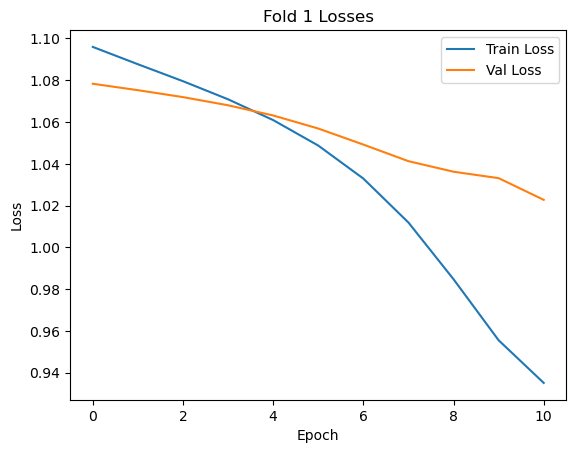

Epoch 20, Train Loss: 0.9092646837234497, Val Loss: 0.938177227973938


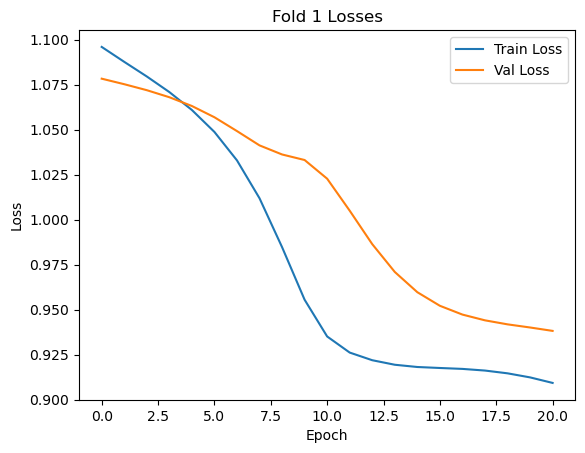

Epoch 30, Train Loss: 0.8535354733467102, Val Loss: 0.9155142307281494


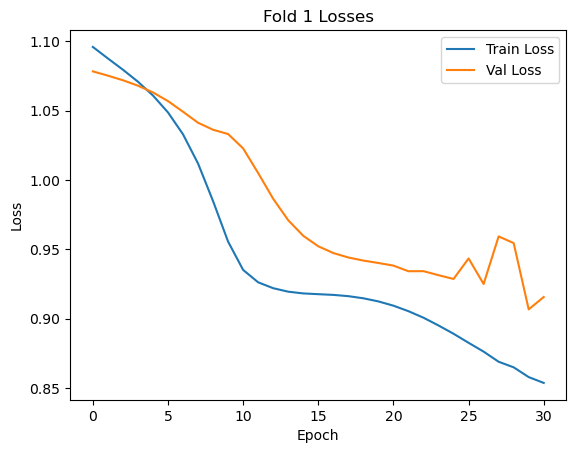

Epoch 40, Train Loss: 0.8118636608123779, Val Loss: 0.865328848361969


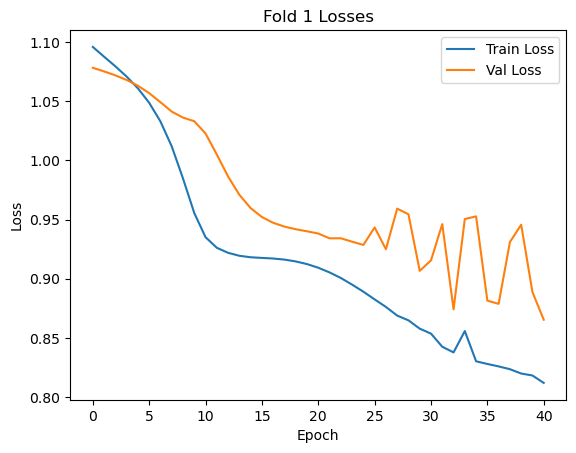

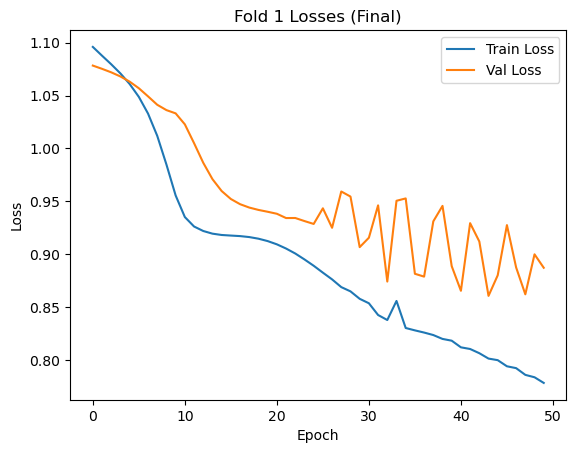

Validation accuracy for fold 1: 0.6923

Fold 2/5
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685
Epoch 0, Train Loss: 1.0952370166778564, Val Loss: 1.083131194114685


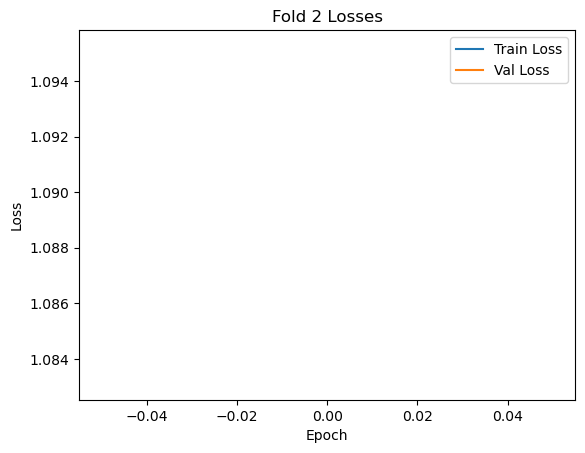

Epoch 10, Train Loss: 0.9295823574066162, Val Loss: 0.8861771821975708


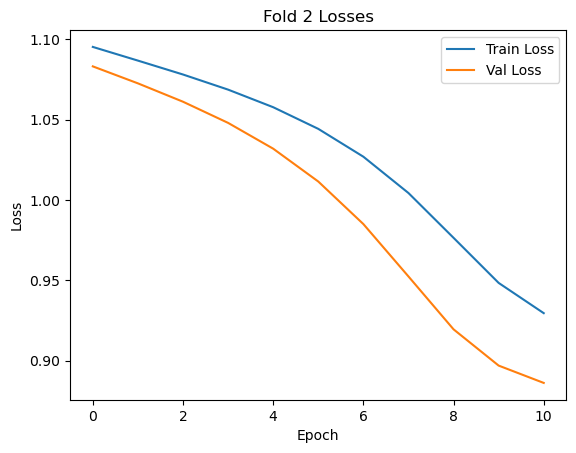

Epoch 20, Train Loss: 0.9089341759681702, Val Loss: 0.8665838241577148


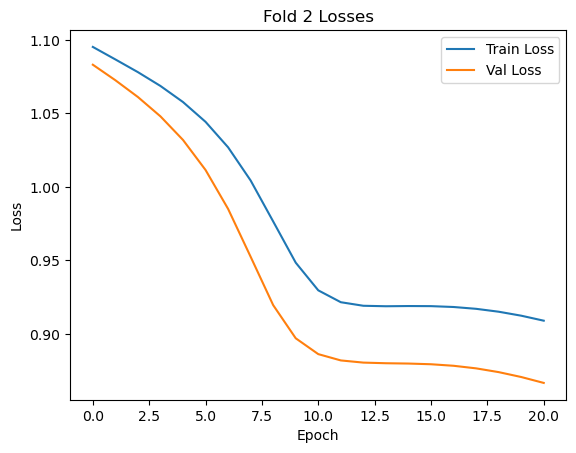

Epoch 30, Train Loss: 0.8626804947853088, Val Loss: 0.8116477727890015


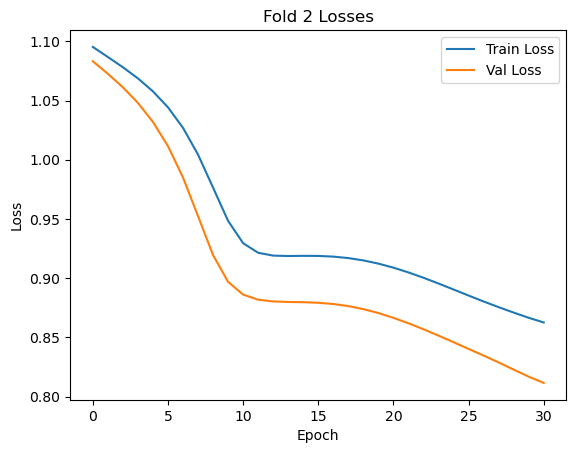

Epoch 40, Train Loss: 0.8287972807884216, Val Loss: 0.7758508920669556


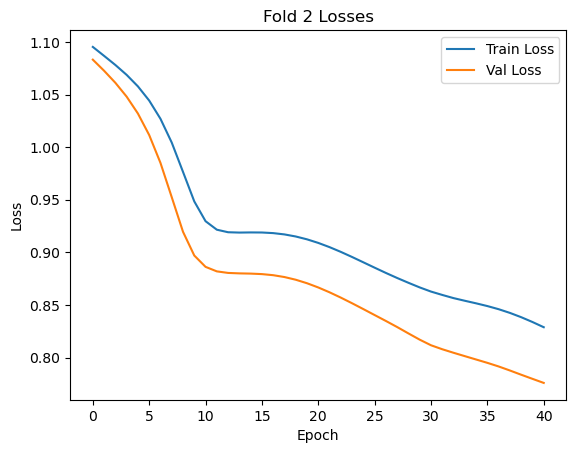

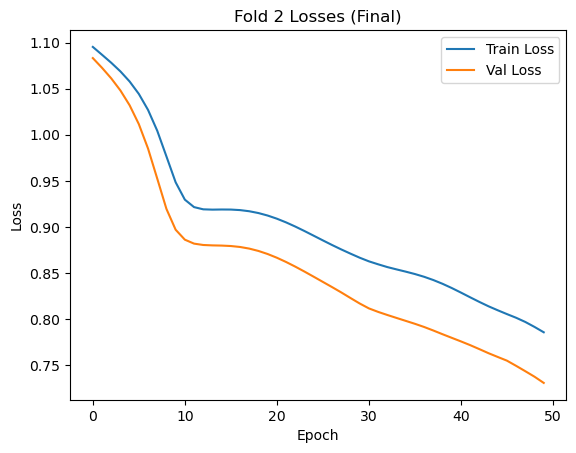

Validation accuracy for fold 2: 0.6154

Fold 3/5
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312
Epoch 0, Train Loss: 1.0907241106033325, Val Loss: 1.0765537023544312


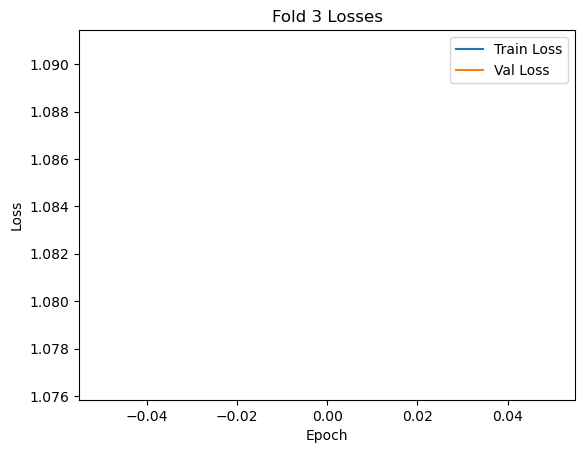

Epoch 10, Train Loss: 0.924263596534729, Val Loss: 0.8907445669174194


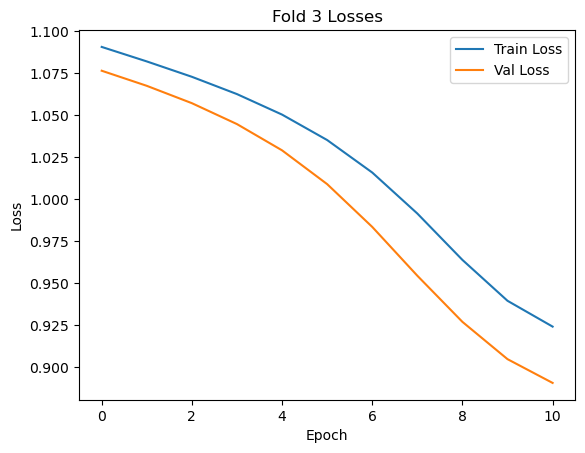

Epoch 20, Train Loss: 0.9027935862541199, Val Loss: 0.8689972758293152


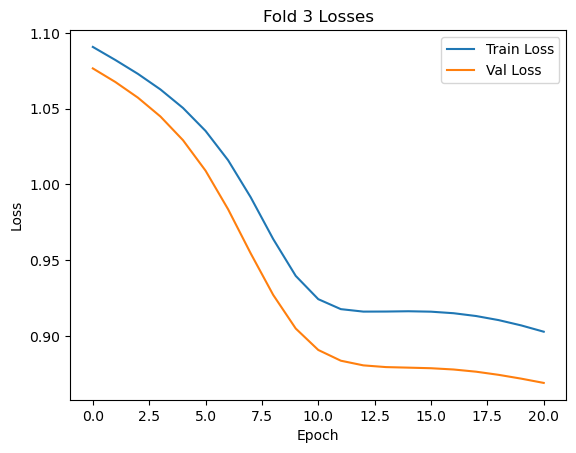

In [ ]:
from sklearn.model_selection import KFold
import numpy as np

def cross_validate_rnn(X, Y, input_size, output_size, n_layers, hidden_size, is_regression, k=5, max_epochs=50):
    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    val_accuracies = []

    for fold, (train_idx, val_idx) in enumerate(kf.split(X)):
        print(f"\nFold {fold+1}/{k}")
        X_train, X_val = X[train_idx], X[val_idx]
        Y_train, Y_val = Y[train_idx], Y[val_idx]
        lengths_train = get_sequence_lengths(X_train)
        lengths_val = get_sequence_lengths(X_val)

        model = RNN(input_size, hidden_size, output_size, n_layers, is_regression).to('cpu')
        optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)

        train_losses = []
        val_losses = []

        # Training loop
        for epoch in range(max_epochs):
            model.train()
            optimizer.zero_grad()
            outputs = model(X_train, lengths_train)
            loss = model.criterion(outputs, Y_train.long())
            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())

            # Validation loss
            model.eval()
            with torch.no_grad():
                val_outputs = model(X_val, lengths_val)
                val_loss = model.criterion(val_outputs, Y_val.long())
                val_losses.append(val_loss.item())

            if epoch % 10 == 0:
                print(f"Epoch {epoch}, Train Loss: {loss.item()}, Val Loss: {val_loss.item()}")
                plt.plot(range(epoch+1), train_losses, label='Train Loss')
                plt.plot(range(epoch+1), val_losses, label='Val Loss')
                plt.xlabel('Epoch')
                plt.ylabel('Loss')
                plt.title(f'Fold {fold+1} Losses')
                plt.legend()
                plt.show()

        # Final plot for this fold
        plt.plot(range(max_epochs), train_losses, label='Train Loss')
        plt.plot(range(max_epochs), val_losses, label='Val Loss')
        plt.xlabel('Epoch')
        plt.ylabel('Loss')
        plt.title(f'Fold {fold+1} Losses (Final)')
        plt.legend()
        plt.show()

        # Validation accuracy
        model.eval()
        with torch.no_grad():
            val_outputs = model(X_val, lengths_val)
            preds = torch.argmax(val_outputs, dim=1)
            accuracy = (preds == Y_val).float().mean().item()
            print(f"Validation accuracy for fold {fold+1}: {accuracy:.4f}")
            val_accuracies.append(accuracy)

    print(f"\nAverage validation accuracy over {k} folds: {np.mean(val_accuracies):.4f}")

# Example usage:
cross_validate_rnn(
    X, Y,
    input_size=X.shape[1],
    output_size=len(unique_labels),
    n_layers=20,
    hidden_size=100,
    is_regression=False,
    k=5,
    max_epochs=50
)

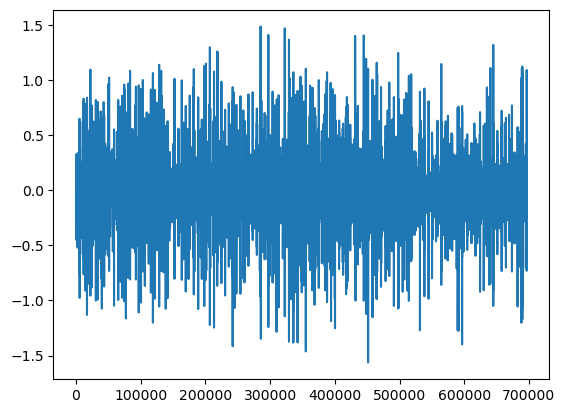

In [ ]:
teste = []
a, sr = librosa.load('/home/cauaf/snap/audacity/1208/Documents/teste.wav')
teste.append(a)
plt.plot(range(len(teste[0])), teste[0])

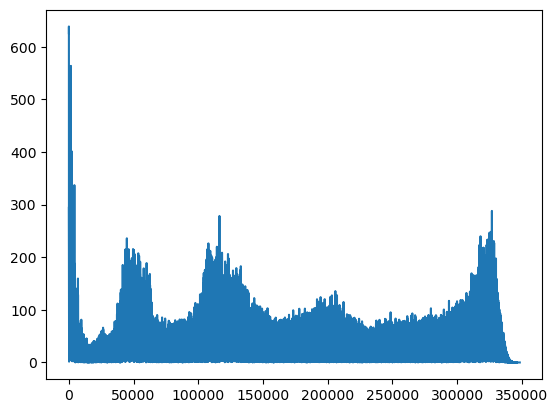

In [ ]:
teste = np.fft.fft(teste[0])
teste = np.abs(teste[0:len(teste)//2])
plt.plot(teste)

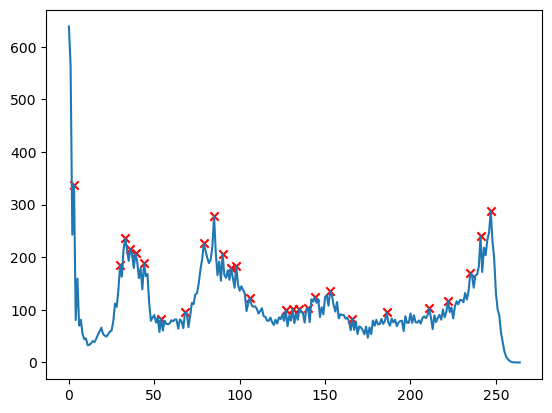

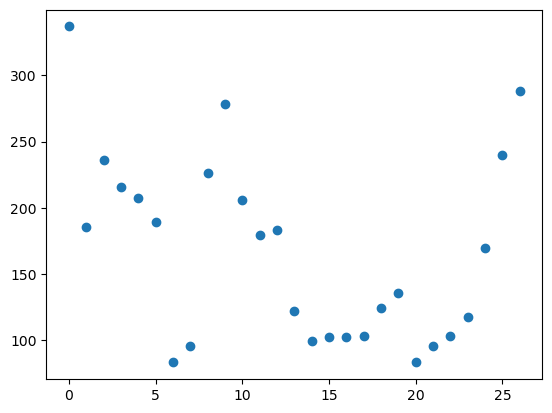

In [ ]:
picos = find_smoothed_peak(teste)
plt.scatter(range(len(picos)),picos)

In [ ]:
# Pad picos and format as a PyTorch tensor for model input, matching training shape and normalization
PADDING_VALUE = -999
max_len = X.shape[2]  # Use training max_len
values = np.array(picos, dtype=np.float32)
indices = np.arange(len(picos), dtype=np.float32)
pad_values = np.pad(values, (0, max_len - len(values)), constant_values=PADDING_VALUE)
pad_indices = np.pad(indices, (0, max_len - len(indices)), constant_values=PADDING_VALUE)
test_db = [[pad_values, pad_indices]]
test_tensor = pad_db_sequences(test_db, padding_value=PADDING_VALUE)
test_tensor = normalize_X(test_tensor, padding_value=PADDING_VALUE)
lengths = get_sequence_lengths(test_tensor, padding_value=PADDING_VALUE)
print('Test tensor shape:', test_tensor.shape)
print('Test tensor:', test_tensor)
print('Test lengths:', lengths)

Test tensor shape: torch.Size([1, 2, 35])
Test tensor: tensor([[[ 2.4607e+00,  2.6585e-01,  9.9865e-01,  7.0324e-01,  5.8638e-01,
           3.1786e-01, -1.2064e+00, -1.0277e+00,  8.5920e-01,  1.6130e+00,
           5.6752e-01,  1.7939e-01,  2.3124e-01, -6.4547e-01, -9.8043e-01,
          -9.3823e-01, -9.3436e-01, -9.2368e-01, -6.1875e-01, -4.5280e-01,
          -1.2133e+00, -1.0363e+00, -9.2626e-01, -7.2079e-01,  3.5202e-02,
           1.0543e+00,  1.7520e+00, -9.9900e+02, -9.9900e+02, -9.9900e+02,
          -9.9900e+02, -9.9900e+02, -9.9900e+02, -9.9900e+02, -9.9900e+02],
         [-1.6690e+00, -1.5407e+00, -1.4123e+00, -1.2839e+00, -1.1555e+00,
          -1.0271e+00, -8.9872e-01, -7.7033e-01, -6.4194e-01, -5.1355e-01,
          -3.8516e-01, -2.5678e-01, -1.2839e-01,  0.0000e+00,  1.2839e-01,
           2.5678e-01,  3.8516e-01,  5.1355e-01,  6.4194e-01,  7.7033e-01,
           8.9872e-01,  1.0271e+00,  1.1555e+00,  1.2839e+00,  1.4123e+00,
           1.5407e+00,  1.6690e+00, -9.9900e

In [ ]:
RedezinhaRecursivinha.eval()  # Set model to evaluation mode
with torch.no_grad():
    test_output = RedezinhaRecursivinha(test_tensor, lengths)
    print('Test output:', test_output)
    predicted_label = torch.argmax(test_output, dim=1).item()
    print(f'Predicted label: {predicted_label} ({list(unique_labels.keys())[predicted_label]})')

Test output: tensor([[-0.9998, -0.7597,  0.9964]])
Predicted label: 2 (2)
